In [1]:
%matplotlib inline

In [2]:
import math
import numpy as np
import matplotlib.pyplot as plt
import skimage
import PIL
import scipy

# Introduction

## Image convolution

Image convolution is a central tool in image analysis, and in this
exercise you will investigate some properties of image convolution
with a Gaussian kernel and its derivatives. 

Convolution is commutative, but we usually distinguish between the
signal and the kernel, and we say that the signal f is convolved with
the kernel g.


Task 1  - gaussian filter

In [184]:


def gaussian(sigma = 20):
    
    s = 4*sigma
    x_list = [-s + i for i in range(2*int(s) + 1)]
    x=np.asarray(x_list)
    g =1/(sigma*math.sqrt(2*math.pi))*np.exp(-x**2/(2*sigma**2))
    dxg = -x/(sigma**3*math.sqrt(2*math.pi))*np.exp(-x**2/(2*sigma**2))
    
    g=np.reshape(g, (g.shape[0],1))
    dxg = np.reshape(dxg, (dxg.shape[0],1))
    return x, g, dxg


sigma=1
x , g , dxg  = gaussian(sigma )
#g =np.reshape(g, (g.shape[0],1))

#plot gaussian
plt.figure()
plt.title(f'Gaussian function sigma = {sigma}')
plt.plot(x,g)
plt.show

#plot gaussian
plt.figure()
plt.title(f'Gaussian derivative sigma = {sigma}')
plt.plot(x,dxg)
plt.show

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<function matplotlib.pyplot.show(*, block=None)>

In [185]:
#%% convolution with gaussian filter
from skimage import io
import cv2

image = io.imread('data/fibres_xcth.png')

identity_x = cv2.filter2D(src=image, ddepth=-1, kernel=g)
identity_y = cv2.filter2D(src=image, ddepth=-1, kernel=g.T)

plt.figure()
plt.imshow(image)
plt.title("original image")
plt.show()

plt.figure()
#cv2.imshow('Identity', identity)
plt.imshow(identity_x)
plt.show()

plt.figure()
#cv2.imshow('Identity', identity)
plt.title("x direction")
plt.imshow(identity_y)
plt.show()

g2=g@g.T
identity_xy = cv2.filter2D(src=image, ddepth=-1, kernel=g2)

plt.figure()
#cv2.imshow('Identity', identity)
plt.title("2d")
plt.imshow(identity_xy)
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [186]:
%% convolution with gaussian filter

#derivative of teh image
k = np.array([0.5, 0, -0.5])
k=np.reshape(k, (k.shape[0],1))

image_y=cv2.filter2D(src=image, ddepth=-1, kernel=k.T)
image_y_gauss=cv2.filter2D(src=image_y, ddepth=-1, kernel=g)

plt.figure()
plt.title("Image derivative smooth with gaussian")
plt.imshow(image_y_gauss)
plt.show()


#derivative of gaussian 


image_dg = cv2.filter2D(src=image, ddepth=-1, kernel=dxg.T)
image_dg = cv2.filter2D(src=image_dg, ddepth=-1, kernel=g)

plt.figure()
plt.title("Image filtered with gaussian derivative and smooth with gaussian")
plt.imshow(image_dg)
plt.show()

image_diff=cv2.subtract(image_y_gauss, image_dg)
plt.figure()
plt.title("Images subtracted")
plt.imshow(image_diff)
plt.show()

UsageError: Cell magic `%%` not found.


### Computing length of segmentation boundary


 For an outcome of a segmentation, as for example shown in Figure 1.5, it may be important to measure some quality of the result. One relevant measurement is a length of the segmentation boundary.

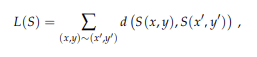

where (x, y) ∼ (x′, y′) indicates two neighboring pixel locations, and d is a discrete metric

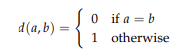

which in this case operates on pixel intensities. In other words, L(S) counts all occurrences of two neighboring pixels having different labels.

In [187]:
import skimage.io
import numpy as np
import matplotlib.pyplot as plt

def boundary_length(S):
    lx = S[1:,:]!=S[:-1,:]
    ly = S[:,1:]!=S[:,:-1]
    L = np.sum(lx)+np.sum(ly)
    return L

fig, ax = plt.subplots(1,3)
path = 'fuel_cells/'

for i in range(3):
    I = skimage.io.imread(f'{path}fuel_cell_{i+1}.tif')
    L = boundary_length(I)
    ax[i].imshow(I)
    ax[i].set_title(f'L={L}')

<IPython.core.display.Javascript object>

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\zuzal\\Masters\\02506 Advance Images Analysis\\fuel_cells\\fuel_cell_1.tif'

### Curve smoothing

 segmentation boundary may be explicitly represented using a sequence of points connected by line segments, which typically delineates
an object in the image. Assume that an N-times-2 matrix X contains x
and y coordinates of N points which define a closed curve, a so-called
snake 
To impose smoothness to this representation, we will need to smooth
the curve. This can be achieved in a simple way by displacing every
curve point towards the average of its two neighbors, possibly iteratively. Point displacement can be seen as a result of filtering the curve
with a kernel λ[1 −2 1], where λ is a parameter controlling the magnitude of the displacement. For efficiency, we want to implement
the curve-smoothing step as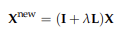

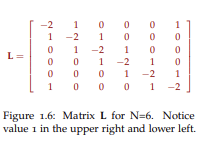

Confirm that one step with λ = 0.5 displaces every curve point exactly to the average of its neighbors.

Shrinkage is caused by the kernel which minimizes curve length.
Instead, we can use a kernel which minimizes the curvature, or even
better, we can weight the elasticity (length minimizing) and rigidity
(curvature minimizing) term. The kernel with the two contributions is 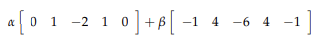

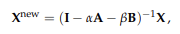

In [ ]:
def regularization_matrix(N, alpha, beta):
    """An NxN matrix for imposing elasticity and rigidity to snakes.
    Arguments: alpha is weigth for second derivative (elasticity),
    beta is weigth for (-)fourth derivative (rigidity)."""
    d = alpha*np.array([-2, 1, 0, 0]) + beta*np.array([-6, 4, -1, 0])
    D = np.fromfunction(lambda i,j: np.minimum((i-j)%N,(j-i)%N), (N,N), dtype=np.int)
    A = d[np.minimum(D,len(d)-1)]
    return(np.linalg.inv(np.eye(N)-A))


path = 'curves/'

X_smooth = np.loadtxt(path + 'dino.txt')
X_noisy = np.loadtxt(path + 'dino_noisy.txt')
N = X_noisy.shape[0]

closed_ind = np.r_[np.arange(N),0] # for easy plotting a closed snake

fig, ax = plt.subplots()
ax.plot(X_smooth[closed_ind,0],X_smooth[closed_ind,1],'g')
ax.plot(X_noisy[closed_ind,0],X_noisy[closed_ind,1],'r')
ax.legend(('ground truth','noisy'),loc=0)
ax.axis('equal')

In [ ]:
# Explicit smoothing, comparing small lambda, big lambda and many iterations.
# Instead of looping, iterations implemented as matrix power.

lambda_small = 0.25;
lambda_big = 1;
nr_iters = 100;

off_diag = np.diag(np.ones(N-1),-1) + np.diag([1],N-1)
L = -2*np.diag(np.ones(N)) + off_diag + off_diag.T
smoothed_small = np.matmul(lambda_small*L+np.eye(N),X_noisy)
smoothed_big = np.matmul(lambda_big*L+np.eye(N),X_noisy)
smoothed_many = np.matmul(np.linalg.matrix_power(lambda_small*L+np.eye(N),nr_iters),X_noisy)

fig, ax = plt.subplots()
ax.plot(smoothed_small[closed_ind,0],smoothed_small[closed_ind,1],'r')
ax.plot(smoothed_big[closed_ind,0],smoothed_big[closed_ind,1],'k')
ax.plot(smoothed_many[closed_ind,0],smoothed_many[closed_ind,1],'c')
ax.legend((f'explicit 1 iteration lambda {lambda_small}',f'explicit 1 iteration lambda {lambda_big}',
           f'explicit {nr_iters} iterations lambda {lambda_small}'),loc=0)

In [ ]:
# Implicit smoothing with both alpha and beta

alpha = 10;
beta = 10;

smoothed_a = np.matmul(regularization_matrix(N,alpha,0),X_noisy)
smoothed_b = np.matmul(regularization_matrix(N,0,beta),X_noisy)

fig, ax = plt.subplots()
ax.plot(smoothed_a[closed_ind,0],smoothed_a[closed_ind,1],'b')
ax.plot(smoothed_b[closed_ind,0],smoothed_b[closed_ind,1],'m')
ax.legend((f'implicit alpha {alpha}', f'implicit beta {beta}'),loc=0)
ax.axis('equal')


#%% SOLVING QUIZ 2021
# Takes in X_noisy
import numpy as np
import matplotlib.pyplot as plt

path = '../../../../Data/week1/curves/'
X_noisy = np.loadtxt(path + 'dino_noisy.txt')
N = X_noisy.shape[0]
closed_ind = np.r_[np.arange(N),0] # for easy plotting a closed snake


def curve_length(X):
    d = X-np.roll(X, shift=1, axis=0)
    d = (d**2).sum(axis=1)
    d = (np.sqrt(d)).sum()
    return(d)

a = np.array([-2, 1, 0])
D = np.fromfunction(lambda i,j: np.minimum((i-j)%N,(j-i)%N), (N,N), dtype=np.int)
L = a[np.minimum(D,len(a)-1)]
X_solution = np.matmul(0.25*L+np.eye(N),X_noisy)

fig, ax = plt.subplots()
ax.plot(X_noisy[closed_ind,0], X_noisy[closed_ind,1],'r')
ax.plot(X_solution[closed_ind,0], X_solution[closed_ind,1],'b--')
ax.set_title(f'noisy:{curve_length(X_noisy):.5g}, smoothed:{curve_length(X_solution):.5g}')
ax.axis('equal')

print(curve_length(X_solution))


#%% optional exercise 1.1.4
import skimage.io
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt

def total_variation(I):
    dx,dy = np.gradient(I)
    v = np.sum(abs(dx))+np.sum(abs(dy))
    return(v)

path = '../../../../Data/week1/'
I = skimage.io.imread(path + 'fibres_xcth.png')

I = I.astype('float')/(2**16-1)
I = I[300:700,300:700]

v = total_variation(I)
Is = scipy.ndimage.gaussian_filter(I, sigma=5, truncate=3, mode='nearest')
vs = total_variation(Is)

fig, ax = plt.subplots(1,2)
ax[0].imshow(I, cmap='gray')
ax[0].set_title(f'total variation is {v}')
ax[1].imshow(Is, cmap='gray')
ax[1].set_title(f'total variation is {vs}')

## QUIZ WEEK1

1. Which number appears in the center of the image when you convolve the image noisy_number_2023. png with an appropriately large Gaussian kernel? (In connection to 1.1 .1 )
2. What is the boundary length computed from the image fuel_cell_2.tif? (In connection to 1.1.2)
3. What is the length of the curve computed by smoothing dino_noisy.txt curve using Equation 1.10 and the parameter $\lambda=0.19$ ? (In connection to 1.1.3)

In [ ]:
#1
import PIL.Image
import scipy.ndimage
import numpy as np
import matplotlib.pyplot as plt

data_path = '../data/week1/'

image_noisy = np.array(PIL.Image.open(data_path + 'noisy_number_2023.png'))
sigma = 15 
image_smoothed = scipy.ndimage.gaussian_filter(image_noisy, sigma, mode='nearest')

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image_noisy)
ax[0].set_title('Noisy image')
ax[1].imshow(image_smoothed)
ax[1].set_title(f'Smoothed with sigma={sigma}')
plt.show()


In [ ]:
#2
def boundary_length(S):
    L = (S[1:, :] != S[:-1, :]).sum() + (S[:, 1:] != S[:, :-1]).sum()
    return L

fig, ax = plt.subplots(1, 3, figsize=(10, 5))
for i in range(3):
    name = f'fuel_cell_{i+1}.tif'
    image = np.array(PIL.Image.open(data_path + 'fuel_cells/' + name))
    length = boundary_length(image)
    ax[i].imshow(image)
    ax[i].set_title(f'{name}\nlength = {length}')
plt.show()

In [ ]:
#3
def curve_length(X):
    d = (np.sqrt(((X - np.roll(X, shift=1, axis=0))**2).sum(axis=1))).sum()
    return(d)

def smoothing_matrix(N):
    #  One way of making smoothing matrix, you can also use scipy.linalg.circulant
    a = np.array([-2, 1, 0]) 
    D = np.fromfunction(lambda i, j: np.minimum((i-j)%N, (j-i)%N), (N, N), dtype = int)
    L = a[np.minimum(D, len(a) - 1)]
    return(L)

X_noisy = np.loadtxt(data_path + 'curves/' + 'dino_noisy.txt')
N = X_noisy.shape[0]
L = smoothing_matrix(N)
lambda_ = 0.19  # lambda is python keyword

X_solution = (lambda_ * L + np.eye(N)) @ X_noisy

closed_ind = np.r_[np.arange(N), 0] # for easy plotting a closed snake

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].plot(X_noisy[closed_ind,0], X_noisy[closed_ind,1], 'r')
ax[1].plot(X_solution[closed_ind,0], X_solution[closed_ind,1], 'b')
ax[0].set_title(f'length noisy: {curve_length(X_noisy):.5g}')
ax[1].set_title(f'lenght smoothed: {curve_length(X_solution):.5g}')
ax[0].axis('equal')
ax[1].axis('equal')
plt.show()



#  Scale-space

For an image $f: \mathbb{R}^2 \rightarrow \mathbb{R}$ the scale-space $L: \mathbb{R}^2 \times R_{+} \rightarrow \mathbb{R}$ is
$$
L(x ; t)=\int_{\xi \in \mathbb{R}^2} f(x-\xi) g(\xi ; t) d \xi,
$$
where $g: \mathbb{R}^2 \times R_{+} \rightarrow \mathbb{R}$ is the $2 \mathrm{D}$ Gaussian.
$$
g(x ; t)=\frac{1}{(2 \pi t)} \exp \left(\frac{-\left(x^2+y^2\right)}{2 t}\right) .
$$
with scale parameter (variance) $t=\sigma^2$.

The size of a Gaussian filter
- Ideally: Infinitely big - but this is impractible
- Empiric rule: $3 \sigma, 4 \sigma$ or $5 \sigma$ rule
- Using $5 \sigma=5 \sqrt{t}$ rule
if $\sigma=2$, filter size of Gaussian is $2 * 5 * 2+1=21$
- if $\sigma=20$, filter size of Gaussian is $2 * 5 * 20+1=201$

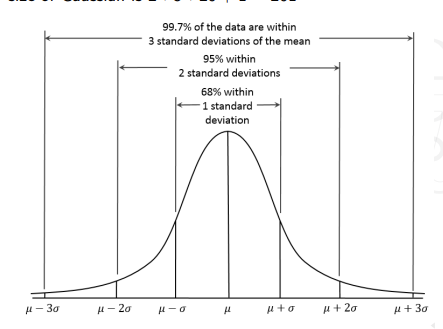

Use repeated semi-group property
$$
\begin{aligned}
& L\left(x, t_1\right)=h\left(x, t_1\right) * f(x) \\
& L\left(x, t_2\right)=L\left(x, t_1+t_1\right)=h\left(x, t_1\right) * L\left(x, t_1\right) \\
& L\left(x, t_3\right)=L\left(x, t_2+t_1\right)=h\left(x, t_1\right) * L\left(x, t_2\right)
\end{aligned}
$$
if $t_1=2$ than $t_2=4, t_3=6, t_4=8$ and so on.

Computing the scale-space is done at a discrete set of steps, and we have the start condition with t = 0 defined as L(x, y; 0) = I(x, y).
For feature detection, we need to compute the derivatives of a scalespace representation. Note that this is conveniently achieved by convolving an image with a kernel that is a derivative of a Gaussian. Blob
detection uses second order derivatives, more precisely the Laplacian
of a Gaussian $\nabla^2 L=L_{x x}+L_{y y}$ which gives a high response where
there is a blob in the image. To detect blobs, we need to find local
maxima and minima of the Laplacian. Some local maxima and minima
will, however, be very weak and they should not be detected as a blob.
Therefore, low responses of the Laplacian of the Gaussian should not
be included. These low-response blobs are excluded by not including
blobs that have an absolute Laplacian response lower than a certain
threshold.
What we still need to do is to ensure that we can detect blobs across
different scales. The image in scale-space representation is increasingly
smoothed, and with increasing scale t, pixels will change their intensity
value towards the average value of the image. Therefore, the absolute
values of derivatives will become smaller when increasing t. For blob
advanced image analysis 
detection, this means that the magnitude of the local maxima and
minima in the scale-space of the Laplacian r2L will decrease and
this smoothing must be compensated. The compensation factors for
different features are given in and for the blob feature it is t . Scale-space: A framework for handling image structures at
multiple scales.  such that the scale normalized Laplacian of Gaussian is t

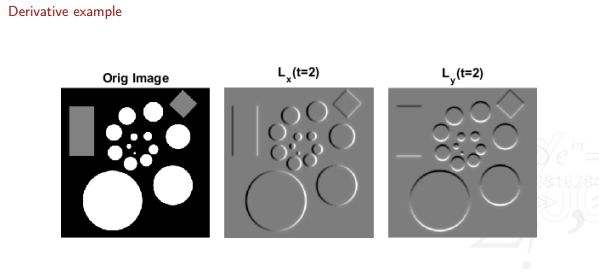

### Scale-space blob detection
Since these fibres are relatively circular we
will model them as circles. This means that we must find their position (center coordinate) and diameter, and for this we will use the scalespace blob detection

In [ ]:
def getGaussDerivative(t, kSize=5):
    '''
    Computes kernels of Gaussian and its derivatives.
    Parameters
    ----------
    t : float
        Variance - t.
    kSize : int
        Parameter determining the size of the kernel.

    Returns
    -------
    g : numpy array
        Gaussian.
    dg : numpy array
        First order derivative of Gaussian.
    ddg : numpy array
        Second order derivative of Gaussian
    dddg : numpy array
        Third order derivative of Gaussian.

    '''
    s = np.sqrt(t)
    x = np.arange(int(-np.ceil(s*kSize)), int(np.ceil(s*kSize))+1)
    x = np.reshape(x,(-1,1))
    g = np.exp(-x**2/(2*t))
    g = g/np.sum(g)
    dg = -x/t*g
    ddg = -g/t - x/t*dg
    dddg = -2*dg/t - x/t*ddg
    return g, dg, ddg, dddg


def getCircles(coord, scale):
    '''
    Compute circle coordinates

    Parameters
    ----------
    coord : numpy array
        2D array of coordinates.
    scale : numpy array
        scale of individual blob (t).

    Returns
    -------
    circ_x : numpy array
        x coordinates of circle. Each column is one circle.
    circ_y : numpy array
        y coordinates of circle. Each column is one circle.

    '''
    theta = np.arange(0, 2*np.pi, step=np.pi/100)
    theta = np.append(theta, 0)
    circ = np.array((np.cos(theta),np.sin(theta)))
    n = coord.shape[0]
    m = circ.shape[1]
    circ_y = np.sqrt(2*scale)*circ[[0],:].T*np.ones((1,n)) + np.ones((m,1))*coord[:,[0]].T
    circ_x = np.sqrt(2*scale)*circ[[1],:].T*np.ones((1,n)) + np.ones((m,1))*coord[:,[1]].T
    return circ_x, circ_y


import skimage.feature
import cv2

def detectFibers(im, diameterLimit, stepSize, tCenter, thresMagnitude):
    '''
    Detects fibers in images by finding maxima of Gaussian smoothed image

    Parameters
    ----------
    im : numpy array
        Image.
    diameterLimit : numpy array
        2 x 1 vector of limits of diameters of the fibers (in pixels).
    stepSize : float
        step size in pixels.
    tCenter : float
        Scale of the Gaussian for center detection.
    thresMagnitude : float
        Threshold on blob magnitude.

    Returns
    -------
    coord : TYPE
        DESCRIPTION.
    scale : TYPE
        DESCRIPTION.

    '''
    
    radiusLimit = diameterLimit/2
    radiusSteps = np.arange(radiusLimit[0], radiusLimit[1]+0.1, stepSize)
    tStep = radiusSteps**2/2
    
    r,c = im.shape
    n = tStep.shape[0]
    L_blob_vol = np.zeros((r,c,n))
    for i in range(0,n):
        g, dg, ddg, dddg = getGaussDerivative(tStep[i])
        L_blob_vol[:,:,i] = tStep[i]*(cv2.filter2D(cv2.filter2D(im,-1,g),-1,ddg.T) + 
                                      cv2.filter2D(cv2.filter2D(im,-1,ddg),-1,g.T))
    # Detect fibre centers
    g, dg, ddg, dddg = getGaussDerivative(tCenter)
    Lg = cv2.filter2D(cv2.filter2D(im, -1, g), -1, g.T)
    
    coord = skimage.feature.peak_local_max(Lg, threshold_abs = thresMagnitude)
    
    # Find coordinates and size (scale) of fibres
    magnitudeIm = np.min(L_blob_vol, axis = 2)
    scaleIm = np.argmin(L_blob_vol, axis = 2)
    scales = scaleIm[coord[:,0], coord[:,1]]
    magnitudes = -magnitudeIm[coord[:,0], coord[:,1]]
    idx = np.where(magnitudes > thresMagnitude)
    coord = coord[idx[0],:]
    scale = tStep[scales[idx[0]]]
    return coord, scale


Single scale space example

In [ ]:
#%% Computing Gaussian and its second order derivative

data_path = 'week2/' # replace with your own data path

im = skimage.io.imread(data_path + 'test_blob_uniform.png').astype(np.float32)

fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(im,cmap='gray')
    
g, dg, ddg, dddg = getGaussDerivative(3)
fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.plot(g)
ax.plot(dg)
ax.plot(ddg)
ax.plot(dddg)

#%% Convolve an image

t = 325
g, dg, ddg, dddg = getGaussDerivative(t)

Lg = cv2.filter2D(cv2.filter2D(im, -1, g), -1, g.T)
fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(Lg,cmap='gray')

#%% Detecting blobs in ONE scale

im = skimage.io.imread(data_path + 'test_blob_uniform.png').astype(np.float32)

Lxx = cv2.filter2D(cv2.filter2D(im, -1, g), -1, ddg.T)
Lyy = cv2.filter2D(cv2.filter2D(im, -1, ddg), -1, g.T)

#Scaled normalized Laplacian
L_blob = t*(Lxx + Lyy)

# how blob response
fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
pos = ax.imshow(L_blob, cmap='gray')
fig.colorbar(pos)

In [ ]:
#%% Find regional maximum in Laplacian
magnitudeThres = 50

coord_pos = skimage.feature.peak_local_max(L_blob, threshold_abs=magnitudeThres)
coord_neg = skimage.feature.peak_local_max(-L_blob, threshold_abs=magnitudeThres)
coord = np.r_[coord_pos, coord_neg]

# Show circles
theta = np.arange(0, 2*np.pi, step=np.pi/100)
theta = np.append(theta, 0)
circ = np.array((np.cos(theta),np.sin(theta)))
n = coord.shape[0]
m = circ.shape[1]

fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(im, cmap='gray')
plt.plot(coord[:,1], coord[:,0], '.r')
circ_y = np.sqrt(2*t)*np.reshape(circ[0,:],(1,-1)).T*np.ones((1,n)) + np.ones((m,1))*np.reshape(coord[:,0],(-1,1)).T
circ_x = np.sqrt(2*t)*np.reshape(circ[1,:],(1,-1)).T*np.ones((1,n)) + np.ones((m,1))*np.reshape(coord[:,1],(-1,1)).T
plt.plot(circ_x, circ_y, 'r')

Multiple scales space example

In [ ]:
# Detecting blobs on MULTIPLE scales

im = skimage.io.imread(data_path + 'test_blob_varying.png').astype(np.float32)

t = 15
g, dg, ddg, dddg = getGaussDerivative(t)

r,c = im.shape
n = 100
L_blob_vol = np.zeros((r,c,n))
tStep = np.zeros(n)

Lg = im
for i in range(0,n):
    tStep[i] = t*i
    L_blob_vol[:,:,i] = t*i*(cv2.filter2D(cv2.filter2D(Lg, -1, g), -1, ddg.T) + 
        cv2.filter2D(cv2.filter2D(Lg, -1, ddg), -1, g.T))
    Lg = cv2.filter2D(cv2.filter2D(Lg, -1, g), -1, g.T)

#%% find maxima in scale-space
thres = 40.0
coord_pos = skimage.feature.peak_local_max(L_blob_vol, threshold_abs = thres)
coord_neg = skimage.feature.peak_local_max(-L_blob_vol, threshold_abs = thres)
coord = np.r_[coord_pos,coord_neg]

# Show circles
theta = np.arange(0, 2*np.pi, step=np.pi/100)
theta = np.append(theta, 0)
circ = np.array((np.cos(theta),np.sin(theta)))
n = coord.shape[0]
m = circ.shape[1]

fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(im, cmap='gray')
plt.plot(coord[:,1], coord[:,0], '.r')
scale = tStep[coord[:,2]]
circ_y = np.sqrt(2*scale)*np.reshape(circ[0,:],(1,-1)).T*np.ones((1,n)) + np.ones((m,1))*np.reshape(coord[:,0],(-1,1)).T
circ_x = np.sqrt(2*scale)*np.reshape(circ[1,:],(1,-1)).T*np.ones((1,n)) + np.ones((m,1))*np.reshape(coord[:,1],(-1,1)).T
plt.plot(circ_x, circ_y, 'r')


## QUIZ WEEK 2
1. What is the mean radius (in pixels) of the black blobs from the image test_blob_varying.png?
2. What is the number of fibers detected by the blob detector in the image CT_lab_med_res.png?
3. What is the mean radius (in pixels) of the blobs from the image CT_lab_med_res.png?

In [ ]:
# Detecting blobs on MULTIPLE scales
data_path='./data/week2/'
im = skimage.io.imread(data_path + 'test_blob_varying.png').astype(np.float32)

t = 4
g, dg, ddg, dddg = getGaussDerivative(t)

r,c = im.shape
n = 400
L_blob_vol = np.zeros((r,c,n))
tStep = np.zeros(n)

Lg = im
for i in range(0,n):
    tStep[i] = t*i
    L_blob_vol[:,:,i] = t*i*(cv2.filter2D(cv2.filter2D(Lg, -1, g), -1, ddg.T) + 
        cv2.filter2D(cv2.filter2D(Lg, -1, ddg), -1, g.T))
    Lg = cv2.filter2D(cv2.filter2D(Lg, -1, g), -1, g.T)

#%% find only black blobs
thres = 30.0
coord_pos = skimage.feature.peak_local_max(L_blob_vol, threshold_abs = thres) 
#coord_neg = skimage.feature.peak_local_max(-L_blob_vol, threshold_abs = thres)
#coord = np.r_[coord_pos,coord_neg]
coord = coord_pos

# Show circles
theta = np.arange(0, 2*np.pi, step=np.pi/100)
theta = np.append(theta, 0)
circ = np.array((np.cos(theta),np.sin(theta)))
n = coord.shape[0]
m = circ.shape[1]


# Visualize
scale = tStep[coord[:,2]]
mean_radius = np.mean(np.sqrt(2*scale))
print(f'Mean radius is {mean_radius}')
#The mean value changes when t changes

Mean radius is 23.97797370099753


In [ ]:
# Detecting blobs on MULTIPLE scales
data_path='./data/week2/'
im = skimage.io.imread(data_path + 'CT_lab_med_res.png').astype(np.float32)

# Radius limit
diameterLimit = np.array([6,20])
stepSize = 0.1

# Parameter for Gaussian to detect center point
tCenter = 7

# Parameter for finding maxima over Laplacian in scale-space
thresMagnitude = 0.055

radiusLimit = diameterLimit/2
radiusSteps = np.arange(radiusLimit[0], radiusLimit[1]+0.1, stepSize)
tStep = radiusSteps**2/2

r,c = im.shape
n = tStep.shape[0]
L_blob_vol = np.zeros((r,c,n))
for i in range(0,n):
    g, dg, ddg, dddg = getGaussDerivative(tStep[i])
    L_blob_vol[:,:,i] = tStep[i]*(cv2.filter2D(cv2.filter2D(im,-1,g),-1,ddg.T) + 
                                    cv2.filter2D(cv2.filter2D(im,-1,ddg),-1,g.T))
# Detect fibre centers
g, dg, ddg, dddg = getGaussDerivative(tCenter)
Lg = cv2.filter2D(cv2.filter2D(im, -1, g), -1, g.T)

coord = skimage.feature.peak_local_max(Lg, threshold_abs = thresMagnitude)

# Find coordinates and size (scale) of fibres
magnitudeIm = np.min(L_blob_vol, axis = 2)
scaleIm = np.argmin(L_blob_vol, axis = 2)
scales = scaleIm[coord[:,0], coord[:,1]]
magnitudes = -magnitudeIm[coord[:,0], coord[:,1]]
idx = np.where(magnitudes > thresMagnitude)
coord = coord[idx[0],:]
scale = tStep[scales[idx[0]]]


print(f'Number of blobs = {coord.shape[0]}')

mean_radius = np.mean(np.sqrt(2*scale))
print(f'Mean radius is {mean_radius}')

Number of blobs = 2487
Mean radius is 4.1472054684358675


# Feature-based segmentation

## Supervised feature-based segmentation

### Image features

A feature for every pixel is a vector of a certain length, say k. The idea is that pixels originating from a similar
texture also have similar feature vectors. To store features for all image
pixels, we can choose to construct an array of size r x c x k, where r and c are dimensions of the image (number of rows and columns)\\

The
first type of feature is obtained by computing a set of image derivatives
by convolving the image with Gaussian kernel and its derivatives.


The second type of features is obtained by collecting pixel intensities
from the patches centered on a pixel.

*Features from a Gaussian and its derivatives*

The Gaussian features are obtained as a stack of Gaussian derivatives.

 In this exercise, we will compute the higher order derivatives until
the fourth order, which will result in a 15-dimensional descriptor that
captures the local appearance of the image. The descriptor is formed by
stacking the Gaussian convolved images, such that each pixel position
has an associated 15-dimensional feature vector. That is, we have $r \times c \times 15$ feature image
$$
\begin{aligned}
F= & {\left[L, L_x, L_y, L_{x x}, L_{x y}, L_{y y}, L_{x x x}, L_{x x y}, L_{x y y}, L_{y y y},\right.} \\
& \left.L_{x x x x}, L_{x x x y}, L_{x x y y}, L_{x y y y}, L_{y y y y}\right] .
\end{aligned}
$$

Since the response of the Gaussian derivatives becomes smaller with
increasing order, we will normalize the layers in the feature image with
the standard deviation of the feature image
$$
\dot{L}(x, y)=\frac{L(x, y)}{\operatorname{std}(L)}
$$
where $\operatorname{std}(L)$ is the standard deviation of the image $L$. We get the feature descriptor as
$$
\begin{aligned}
\dot{F}= & {\left[\dot{L}, \dot{L}_x, \dot{L}_y, \dot{L}_{x x}, \dot{L}_{x y}, \dot{L}_{y y}, \dot{L}_{x x x}, \dot{L}_{x x y}, \dot{L}_{x y y}, \dot{L}_{y y y},\right.} \\
& \left.\dot{L}_{x x x x}, \dot{L}_{x x x y}, \dot{L}_{x x y y}, \dot{L}_{x y y y}, \dot{L}_{y y y y}\right] .
\end{aligned}
$$

In [ ]:
#Local features functions 
import scipy.ndimage

def get_gauss_feat_im(im, sigma=1, normalize=True):
    """Gauss derivative feaures for every image pixel.
    Arguments:
        image: a 2D image, shape (r,c).
        sigma: standard deviation for Gaussian derivatives.
        normalize: flag indicating normalization of features.
    Returns:
        imfeat: 3D array of size (r,c,15) with a 15-dimentional feature
             vector for every pixel in the image.
    Author: vand@dtu.dk, 2020
    """
      
    r,c = im.shape
    imfeat = np.zeros((r,c,15))
    imfeat[:,:,0] = scipy.ndimage.gaussian_filter(im,sigma,order=0)
    imfeat[:,:,1] = scipy.ndimage.gaussian_filter(im,sigma,order=[0,1])
    imfeat[:,:,2] = scipy.ndimage.gaussian_filter(im,sigma,order=[1,0])
    imfeat[:,:,3] = scipy.ndimage.gaussian_filter(im,sigma,order=[0,2])
    imfeat[:,:,4] = scipy.ndimage.gaussian_filter(im,sigma,order=[1,1])
    imfeat[:,:,5] = scipy.ndimage.gaussian_filter(im,sigma,order=[2,0])
    imfeat[:,:,6] = scipy.ndimage.gaussian_filter(im,sigma,order=[0,3])
    imfeat[:,:,7] = scipy.ndimage.gaussian_filter(im,sigma,order=[1,2])
    imfeat[:,:,8] = scipy.ndimage.gaussian_filter(im,sigma,order=[2,1])
    imfeat[:,:,9] = scipy.ndimage.gaussian_filter(im,sigma,order=[3,0])
    imfeat[:,:,10] = scipy.ndimage.gaussian_filter(im,sigma,order=[0,4])
    imfeat[:,:,11] = scipy.ndimage.gaussian_filter(im,sigma,order=[1,3])
    imfeat[:,:,12] = scipy.ndimage.gaussian_filter(im,sigma,order=[2,2])
    imfeat[:,:,13] = scipy.ndimage.gaussian_filter(im,sigma,order=[3,1])
    imfeat[:,:,14] = scipy.ndimage.gaussian_filter(im,sigma,order=[4,0])

    if normalize:
        imfeat -= np.mean(imfeat, axis=(0,1))
        im_std = np.std(imfeat, axis=(0,1))
        im_std[im_std<10e-10] = 1
        imfeat /= im_std
    
    return imfeat

def get_gauss_feat_multi(im, sigma = [1,2,4], normalize = True):
    '''Multi-scale Gauss derivative feaures for every image pixel.
    Arguments:
        image: a 2D image, shape (r,c).
        sigma: list of standard deviations for Gaussian derivatives.
        normalize: flag indicating normalization of features.
    Returns:
        imfeat: a a 3D array of size (r*c,n_scale,15) with n_scale features in each pixels, and
             n_scale is length of sigma. Each pixel contains a feature vector and feature
             image is size (r,c,15*n_scale).
    Author: abda@dtu.dk, 2021

    '''
    imfeats = []
    for i in range(0,len(sigma)):
        feat = get_gauss_feat_im(im, sigma[i], normalize)
        imfeats.append(feat.reshape(-1,feat.shape[2]))
    
    imfeats = np.asarray(imfeats).transpose(1,0,2)
    return imfeats


def im2col(im, patch_size=[3,3], stepsize=1):
    """Rearrange image patches into columns
    Arguments:
        image: a 2D image, shape (r,c).
        patch size: size of extracted paches.
        stepsize: patch step size.
    Returns:
        patches: a 2D array which in every column has a patch associated 
            with one image pixel. For stepsize 1, number of returned column 
            is (r-patch_size[0]+1)*(c-patch_size[0]+1) due to bounary. The 
            length of columns is pathc_size[0]*patch_size[1].
    """
    
    r,c = im.shape
    s0, s1 = im.strides    
    nrows =r-patch_size[0]+1
    ncols = c-patch_size[1]+1
    shp = patch_size[0],patch_size[1],nrows,ncols
    strd = s0,s1,s0,s1

    out_view = np.lib.stride_tricks.as_strided(im, shape=shp, strides=strd)
    return out_view.reshape(patch_size[0]*patch_size[1],-1)[:,::stepsize]


def ndim2col(im, block_size=[3,3], stepsize=1):
    """Rearrange image blocks into columns for N-D image (e.g. RGB image)"""""
    if(im.ndim == 2):
        return im2col(im, block_size, stepsize)
    else:
        r,c,l = im.shape
        patches = np.zeros((l*block_size[0]*block_size[1],
                            (r-block_size[0]+1)*(c-block_size[1]+1)))
        for i in range(l):
            patches[i*block_size[0]*block_size[1]:(i+1)*block_size[0]*block_size[1],
                    :] = im2col(im[:,:,i],block_size,stepsize)
        return patches

#%%
'''import skimage.io
import matplotlib.pyplot as plt

if __name__ == '__main__':
    
    filename = '../../../../Data/week3/3labels/training_image.png'
    I = skimage.io.imread(filename)
    I = I.astype(np.float)
    
    
    # features based on gaussian derivatives
    sigma = 1;
    gf = get_gauss_feat_im(I, sigma)
    
    fig,ax = plt.subplots(3,5)
    for j in range(5):
        for i in range(3):
            ax[i][j].imshow(gf[:,:,5*i+j], cmap='jet')
            print(np.std(gf[:,:,5*i+j]))
            ax[i][j].set_title(f'layer {5*i+j}')
            
            
    # features based on image patches
    I = I[300:320,400:420] # smaller image such that we can see the difference in layers
    pf = im2col(I,[3,3])
    pf = pf.reshape((9,I.shape[0]-2,I.shape[1]-2))
            
    fig,ax = plt.subplots(3,3)
    for j in range(3):
        for i in range(3):
            ax[i][j].imshow(pf[3*i+j], cmap='jet')
            ax[i][j].set_title(f'layer {3*i+j}')'''

In [ ]:
def ind2labels(ind):
    """ Helper function for transforming uint8 image into labeled image."""
    return np.unique(ind, return_inverse=True)[1].reshape(ind.shape)

path = '../../../../Data/week3/3labels/' # Change path to your directory

#%% READ IN IMAGES
training_image = skimage.io.imread(path + 'training_image.png')
training_image = training_image.astype(np.float)
training_labels = skimage.io.imread(path + 'training_labels.png')

training_labels = ind2labels(training_labels)
nr_labels = np.max(training_labels)+1 # number of labels in the training image

fig, ax = plt.subplots(1,2)
ax[0].imshow(training_image, cmap=plt.cm.gray)
ax[0].set_title('training image')
ax[1].imshow(training_labels)
ax[1].set_title('labels for training image')

#%% TRAING THE MODEL

sigma = [1,2,3]
features = lf.get_gauss_feat_multi(training_image, sigma)
features = features.reshape((features.shape[0], features.shape[1]*features.shape[2]))
labels = training_labels.ravel()

labels = training_labels.ravel()


nr_keep = 15000 # number of features randomly picked for clustering 
keep_indices = np.random.permutation(np.arange(features.shape[0]))[:nr_keep]

features_subset = features[keep_indices,:]
labels_subset = labels[keep_indices]

nr_clusters = 1000 # number of feature clusters
# for speed, I use mini-batches
kmeans = sklearn.cluster.MiniBatchKMeans(n_clusters=nr_clusters, batch_size=2*nr_clusters)
kmeans.fit(features_subset)
assignment = kmeans.labels_

edges = np.arange(nr_clusters+1)-0.5 # histogram edges halfway between integers
hist = np.zeros((nr_clusters,nr_labels))
for l in range(nr_labels):
    hist[:,l] = np.histogram(assignment[labels_subset==l],bins=edges)[0]
sum_hist = np.sum(hist,axis=1)
cluster_probabilities = hist/(sum_hist.reshape(-1,1))

fig, ax = plt.subplots(1,2)
legend_label = [f'label {x}' for x in range(nr_labels)]

ax[0].plot(hist,'.')
ax[0].set_xlabel('cluster id')
ax[0].set_ylabel('number of features in cluster')
ax[0].legend(legend_label)
ax[0].set_title('features in clusters per label')
ax[1].plot(cluster_probabilities,'.')
ax[1].set_xlabel('cluster id')
ax[1].set_ylabel('label probability for cluster')
ax[1].legend(legend_label)
ax[1].set_title('cluster probabilities')

# Finished training

#%% USING THE MODEL
testing_image = skimage.io.imread(path + 'testing_image.png')
testing_image = testing_image.astype(np.float)

features_testing = lf.get_gauss_feat_multi(testing_image, sigma)
features_testing = features_testing.reshape((features_testing.shape[0], features_testing.shape[1]*features_testing.shape[2]))
labels = training_labels.ravel()

assignment_testing = kmeans.predict(features_testing)

probability_image = np.zeros((assignment_testing.size, nr_labels))
for l in range(nr_labels):
    probability_image[:,l] = cluster_probabilities[assignment_testing, l]
probability_image = probability_image.reshape(testing_image.shape + (nr_labels,))

P_rgb = np.zeros(probability_image.shape[0:2]+(3,))
k = min(nr_labels,3)
P_rgb[:,:,:k] = probability_image[:,:,:k]

fig, ax = plt.subplots(1,2)
ax[0].imshow(testing_image, cmap=plt.cm.gray)
ax[0].set_title('testing image')
ax[1].imshow(P_rgb)
ax[1].set_title('probabilities for testing image as RGB')

#%% SMOOTH PROBABILITY MAP

sigma = 3 # Gaussian smoothing parameter

seg_im_max = np.argmax(P_rgb,axis = 2)
c = np.eye(P_rgb.shape[2])
P_rgb_max = c[seg_im_max]

probability_smooth = np.zeros(probability_image.shape)
for i in range(0,probability_image.shape[2]):
    probability_smooth[:,:,i] = scipy.ndimage.gaussian_filter(probability_image[:,:,i],sigma,order=0)
seg_im_smooth = np.argmax(probability_smooth,axis=2)

probability_smooth_max = c[seg_im_smooth]

P_rgb_smooth = np.zeros(probability_smooth_max.shape[0:2]+(3,))
k = min(nr_labels,3)
P_rgb_smooth[:,:,:k] = probability_smooth[:,:,:k]
P_rgb_smooth_max = np.zeros(probability_smooth_max.shape[0:2]+(3,))
P_rgb_smooth_max[:,:,:k] = probability_smooth_max[:,:,:k]

# Display result
fig,ax = plt.subplots(2,4,sharex=True,sharey=True)
ax[0][0].imshow(P_rgb[:,:,0])
ax[0][1].imshow(P_rgb[:,:,1])
ax[0][2].imshow(P_rgb[:,:,2])
ax[0][3].imshow(P_rgb_max)
ax[1][0].imshow(P_rgb_smooth[:,:,0])
ax[1][1].imshow(P_rgb_smooth[:,:,1])
ax[1][2].imshow(P_rgb_smooth[:,:,2])
ax[1][3].imshow(P_rgb_smooth_max)


## QUIZ WEEK 3 (chapter 3)

1. You have an image of the size $256 \times 384$ pixels and you want to compute dense features consisting of pixel intensities collected from $5 \times 5$ patches centered around each pixel, where such patch is valid. You want to store the extracted features in a 3D array. What is the total number of elements (i.e. a single number which is a product height $\times$ width $\times$ depth) of the array you would choose to store the features?
2. You are approaching a 3-label segmentation as explained in the exercise 3.2. You choose to cluster the features extracted from the training image in 1000 clusters. It turns out, that cluster number 408 contains 653 image features. Out of these 653 features, 483 features are labeled with label 2 . What is $p_{408}(1)+p_{408}(3)$ ?
3. You are segmenting an image into labels 1, 2, and 3. You represent the probability image using an $r \times c \times 3$ array. The first three rows, five columns and two layers of the probability image are shown below. Which label is dominant in the segmentation of this $3 \times 5$ window?

0.01|	0.11|	0.21|	0.31|	0.41|

0.04|	0.14|	0.24|	0.34|	0.44|

0.07|	0.17|	0.27|	0.37|	0.47|


0.23	0.26	0.29	0.32	0.35
0.3 	0.33	0.36	0.39	0.42
0.37	0.4	0.43	0.46	0.49



In [ ]:
#1
h=256
w=384
p=5

feature_size=p**2
ar=(h-p+1)*(w-p+1)*feature_size
print(ar)

p = 5
h = 256
w = 384

features_size = (h - p + 1) * (w - p + 1) * (p**2)
print(f'{features_size = }')

2394000
features_size = 2394000


In [ ]:
#2
total_features=653
label_2=483

cluster_probability = 1 - label_2/total_features
print(f'{cluster_probability = }')

cluster_probability = 0.2603369065849923


In [ ]:
# dominant semgentation
import numpy as np

P1 = np.array([[0.01, 0.11, 0.21, 0.31, 0.41],
    [0.04, 0.14, 0.24, 0.34, 0.44],
    [0.07, 0.17, 0.27, 0.37, 0.47]])
P2 = np.array([[0.23, 0.26, 0.29, 0.32, 0.35],
    [0.30, 0.33, 0.36, 0.39, 0.42],
    [0.37, 0.40, 0.43, 0.46, 0.49]])

P = np.stack([P1, P2, 1-(P1+P2)])
S = np.argmax(P, axis=0) + 1  # segmentation into 1, 2, 3
counts = np.unique(S, return_counts=True)[1]  # how many times each label occurs
dominant_segmentation = np.argmax(counts) + 1

print(f'{dominant_segmentation = }')

dominant_segmentation = 3


# Feature-based registration

Image registration is the process of transforming one image (the
moving image) to the coordinate system of another image (the target image). We will compute this transformation by matching image features.
Here we will use SIFT features (Scale invariant feature transform) that
are described in detail in1

We will use SIFT for feature-based image registration. The problem
we address is that we are given two images that depict the same object
and we want to find an image transformation that aligns the two
images. This allows us to compare structures found in one image with
structures found in the other image. In some cases, the difference
between images can be modeled by a rotation R, translation t and scale
s. This is e.g. the case in microscopy or CT, where pixels have a fixed
physical size. A more general affine transformation can be computed
using a homography, but in cases where the imaging system can only
transform the image by a rotation, translation, and scale, these will
be the appropriate parameters to compute. Here we will work with
sets of corresponding 2D points, where the correspondence is found by
matching SIFT features

Fitting two sets of $2 \mathrm{D}$ points in least squares sense. For two 2D point sets $P$ and $\mathrm{Q}$ with corresponding elements $\mathrm{p}_1$ and $q_i(2 \times 1$ column vectors), where $i=1, \ldots, k$, we are inberested in finding a rotation $\mathbf{R}$, a translation $t$ and a scale s that minimizes the squared distance between the two point sets. The transformation from one polnt set to the other is ghven by
$$
q_i=s \mathrm{R}_{\mathrm{p}} \mathbf{i}+\mathrm{t}
$$
The sale s can be found e.8. by computing the ratio betwoen average distance to the centroid of each point set
$$
s=\frac{\sum_{1=1}^n\left\|q_i-\mu_4\right\|}{\sum_{i=1}^n \mid p_i-\mu_F \|}
$$
where $\mu_P=\frac{1}{1} \sum_{i=1}^e P_1$ and $\mu_q=\frac{1}{1} \sum_{i=1}^{-e} q_i$ are the controuds of $\mathrm{P}_i$ and $q_i$ respectively.
Now we want to find the rotation and translatice that minimias
$$
\sum_{i=1}^n\left(q_i-s \mathbf{R}_p v-\mathbf{t}\right)^2
$$
One way of least-squares fitting $2 \mathrm{D}$ polint sets involves 2 -by-2 covariance matrix (normalization is not needed)
$$
\mathrm{C}=\sum_{i=1}^\pi\left(q_i-\mu_q\right)\left(\mathbf{p}_1-\mu_p\right)^T
$$
and its singular value decomposition
$$
\mathrm{U \Sigma} \mathrm{V}^{\mathrm{T}}=\mathrm{C} \text {. }
$$
Here, $\mathbf{U}$ and $\mathbf{V}$ are the left and right singular matrices respectively and $\Sigma$ is a digonal 2-by-2 matrix containing the slingular values. From this, we obtain the rotatice
$$
\mathbf{\hat{R}}=\mathbf{U V}^2
$$
In rare cases, this computation can result in a reflection instead of a rotation. If the determinant of $\operatorname{det}(\mathbb{\hat{R}})=1$ it is a rotation and if $\operatorname{det}(\mathbf{\hat{R}})=-1$ it is a reflection. This computation will typically only result in a reflection e.g. if there are only two points for determining the rotation. Therefore, we can compute the rotation taking this into account by
$$
\mathbf{R}=\mathbf{\hat{R} D}
$$
where
$$
\mathbf{D}=\left[\begin{array}{cc}
1 & 0 \\
0 & \operatorname{det}(\hat{\mathbf{R}})
\end{array}\right]
$$
Finally, we find the translation as the average vector from points in q to the rotated points in $\mathrm{p}$
$$
\mathrm{t}=\frac{1}{n} \sum_{i=1}^n\left(\mathbf{q}_i-s \mathbf{R}\mathbf{p}_i\right)=\mathbf{\mu}_q-s \mathbf{R} \mathbf{\mu}_p .
$$



### Rotation, translation and scale
You should implement a function that takes two point sets as input and
returns the rotation, translation, and scale.

(2, 10)


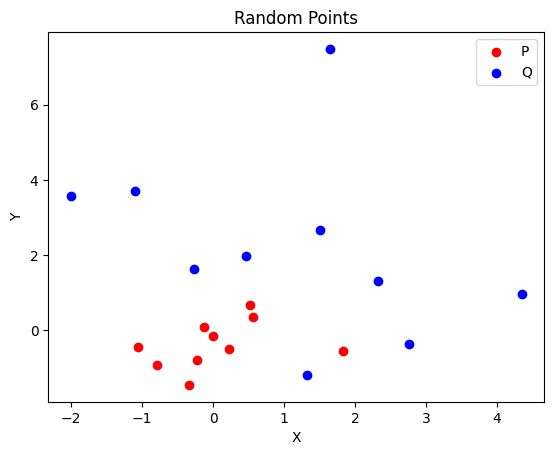

In [ ]:
import numpy as np
import cv2
from scipy.interpolate import RegularGridInterpolator
import random

def rotate_theta_2d(angle):
    theta = angle/180*np.pi
    R = np.array([[np.cos(theta), -np.sin(theta)],
                   [np.sin(theta), np.cos(theta)]])
    return R


def generate_random_points(num_points):
    return  np.random.randn(2,num_points)

s=3
angle = 90
R=rotate_theta_2d(angle)
t=np.array([0,2])
P = generate_random_points(10) 
print(P.shape)
Q= s * R @ P + t.reshape(-1, 1)

# Separate x and y coordinates for plotting


# Plot the points
plt.scatter(P[0], P[1], color='red', label='P')
plt.scatter(Q[0], Q[1], color='blue', label='Q')

# Add labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Random Points')
plt.legend()

# Show the plot
plt.show()

In [ ]:
#Find t, R and s from two sets of points

def get_transformation(p,q):
    '''
    Compute the transformation parameters of hte equation:
        q = s*R@p + t

    Parameters
    ----------
    p : numpy array
        2 x n array of points.
    q : numpy array
        2 x n array of points. p and q corresponds.

    Returns
    -------
    R : numpy array
        2 x 2 rotation matrix.
    t : numpy array
        2 x 1 translation matrix.
    s : float
        scale parameter.

    '''
    m_p = np.mean(p,axis=1,keepdims=True)
    m_q = np.mean(q,axis=1,keepdims=True)
    s = np.linalg.norm(q-m_q)/np.linalg.norm(p-m_p)
    
    C = (q-m_q)@(p-m_p).T
    U,S,V = np.linalg.svd(C)
    
    R_ = U@V
    R = R_@np.array([[1,0],[0,np.linalg.det(R_)]])
    
    t = m_q - s*R@m_p
    return R,t,s

# Robust transformation

def get_robust_transformation(p,q,thres = 3):
    '''
    Compute the transformation parameters of hte equation:
        q = s*R@p + t

    Parameters
    ----------
    p : numpy array
        2 x n array of points.
    q : numpy array
        2 x n array of points. p and q corresponds.

    Returns
    -------
    R : numpy array
        2 x 2 rotation matrix.
    t : numpy array
        2 x 1 translation matrix.
    s : float
        scale parameter.
    idx : numpy array
        index of the points in p and q that are inliers in the robust match

    '''
    
    R,t,s = get_transformation(p,q)

    q_1 = s*R@p + t
    d = np.linalg.norm(q - q_1, axis=0)
    idx = np.where(d<thres)[0]
    
    R,t,s = get_transformation(p[:,idx],q[:,idx])
    
    return R,t,s,idx



In [ ]:
R2,t2,s2 = get_transformation(P,Q)

print(f'Original: Rotation:\n{R}\n\nTranslation:\n{t}\n\nScale: {s}\n')
print(f'Computed: Rotation:\n{R2}\n\nTranslation:\n{t2}\n\nScale: {s2}')


R=array([[-2.39552819e-17, -1.00000000e+00],
       [ 1.00000000e+00,  3.20921560e-16]])
t=array([[-1.55431223e-15],
       [ 2.00000000e+00]])
s=3.0


In [ ]:
#Add noise

sc = 0.3
Qn = Q + sc*np.random.randn(Q.shape[0], Q.shape[1])

Rn,tn,sn = get_transformation(P,Qn)

print(f'Original: Rotation:\n{R}\n\nTranslation:\n{t}\n\nScale: {s}\n')
print(f'Computed: Rotation:\n{Rn}\n\nTranslation:\n{tn}\n\nScale: {sn}')

Original: Rotation:
[[-2.39552819e-17 -1.00000000e+00]
 [ 1.00000000e+00  3.20921560e-16]]

Translation:
[[-1.55431223e-15]
 [ 2.00000000e+00]]

Scale: 3.0

Computed: Rotation:
[[-0.00412167 -0.99999151]
 [ 0.99999151 -0.00412167]]

Translation:
[[-0.03633512]
 [ 1.83759114]]

Scale: 3.1480136059981207


### Compute and match SWIFT features

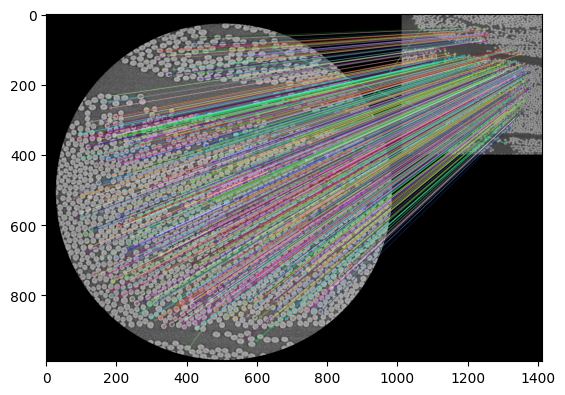

(<matplotlib.image.AxesImage at 0x1d12d41ca60>, None)

In [ ]:
path = './data/week4/' # Replace with your own path

im1 = cv2.imread(path + 'CT_lab_high_res.png',cv2.IMREAD_GRAYSCALE) # queryImage
im2 = cv2.imread(path + 'CT_lab_low_res.png',cv2.IMREAD_GRAYSCALE) # trainImage

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(im1,None)
kp2, des2 = sift.detectAndCompute(im2,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    # Apply the Lowe criterion best should be closer than second best
    if m.distance/(n.distance + 10e-10) < 0.6:
        good.append([m])

# cv.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(im1,kp1,im2,kp2,good,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3),plt.show()



In [ ]:
#%% Match SIFT - function to extract the coordinates of matching points

# Parameters that can be extracted from keypoints
# keypoint.pt[0],
# keypoint.pt[1],
# keypoint.size,
# keypoint.angle,
# keypoint.response,
# keypoint.octave,
# keypoint.class_id,

def match_SIFT(im1, im2, thres = 0.6):
    
    # Initiate SIFT detector
    sift = cv2.SIFT_create()
    
    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(im1,None)
    kp2, des2 = sift.detectAndCompute(im2,None)
    
    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2,k=2)
    
    # Apply ratio test
    good_matches = []
    
    for m,n in matches:
        if m.distance/(n.distance+10e-10) < thres:
            good_matches.append([m])
    
    # Find coordinates
    pts_im1 = [kp1[m[0].queryIdx].pt for m in good_matches]
    pts_im1 = np.array(pts_im1, dtype=np.float32).T
    pts_im2 = [kp2[m[0].trainIdx].pt for m in good_matches]
    pts_im2 = np.array(pts_im2, dtype=np.float32).T
    return pts_im1, pts_im2

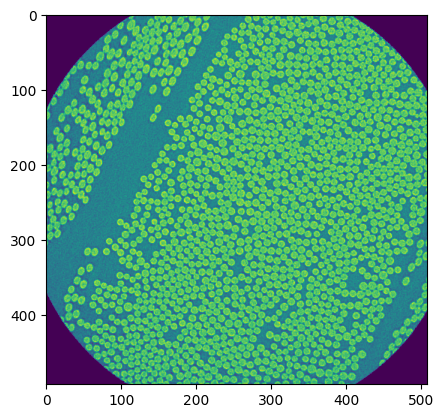

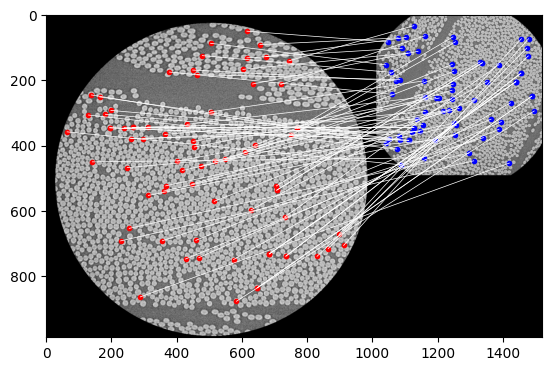

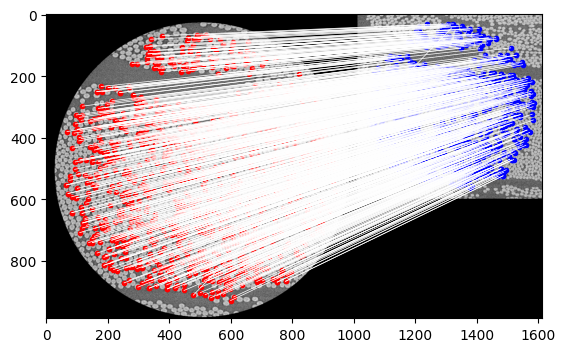

In [ ]:
#%% Create a test image - Rotate, scale and crop image

ang = 67
sc = 0.6
imr = scipy.ndimage.rotate(scipy.ndimage.zoom(im1,sc),ang,reshape=False)[50:-50,50:-50]
plt.imshow(imr)

#%% Plot the keypoints with very low threshold (0.1) to see what is going on

pts_im1, pts_im2 = match_SIFT(im1, imr, 0.1)

def plot_matching_keypoints(im1, im2, pts_im1, pts_im2):
    r1,c1 = im1.shape
    r2,c2 = im2.shape
    n_row = np.maximum(r1, r2)
    n_col = c1 + c2
    im_comp = np.zeros((n_row,n_col))
    im_comp[:r1,:c1] = im1
    im_comp[:r2,c1:(c1+c2)] = im2
    
    fig,ax = plt.subplots(1)
    ax.imshow(im_comp, cmap='gray')
    ax.plot(pts_im1[0],pts_im1[1],'.r')
    ax.plot(pts_im2[0]+c1,pts_im2[1],'.b')
    ax.plot(np.c_[pts_im1[0],pts_im2[0]+c1].T,np.c_[pts_im1[1],pts_im2[1]].T,'w',linewidth = 0.5)

plot_matching_keypoints(im1,imr,pts_im1, pts_im2)

#%% Plot the keypoints between image 1 and image 2

pts_im1, pts_im2 = match_SIFT(im1, im2, 0.6)
plot_matching_keypoints(im1,im2,pts_im1, pts_im2)



Transformations: Rotation:
[[ 0.99999905 -0.00139885]
 [ 0.00139885  0.99999905]]

Translation:
[[11.85586852]
 [16.04576245]]

Scale: 1.6232304573059082

Angle: 0.07912937001338383


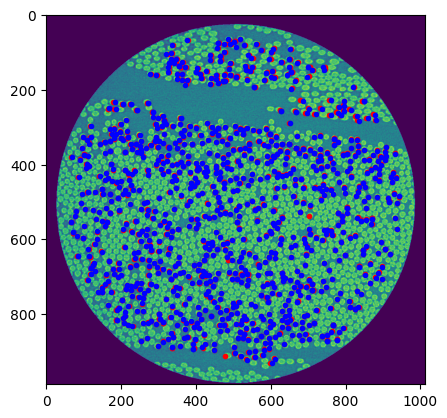

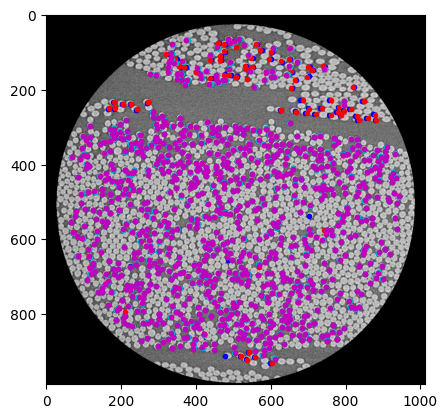

In [ ]:
#%% Compute the transformaions and plot them on top of each other

R,t,s = get_transformation(pts_im2,pts_im1)

print(f'Transformations: Rotation:\n{R}\n\nTranslation:\n{t}\n\nScale: {s}\n\nAngle: {np.arccos(R[0,0])/np.pi*180}')
pts_im1_1 = s*R@pts_im2 + t

fig,ax = plt.subplots(1)
ax.imshow(im1)
ax.plot(pts_im1[0],pts_im1[1],'.r')
ax.plot(pts_im1_1[0],pts_im1_1[1],'.b')

#%% Robust transformation - kept points are shown in cyan and magenta

R,t,s,idx = get_robust_transformation(pts_im2,pts_im1)

pts_im1_2 = s*R@pts_im2 + t

fig,ax = plt.subplots(1)
ax.imshow(im1, cmap = 'gray')
ax.plot(pts_im1[0],pts_im1[1],'.b')
ax.plot(pts_im1_2[0],pts_im1_2[1],'.r')
ax.plot(pts_im1[0,idx],pts_im1[1,idx],'.c')
ax.plot(pts_im1_2[0,idx],pts_im1_2[1,idx],'.m')


 ...]

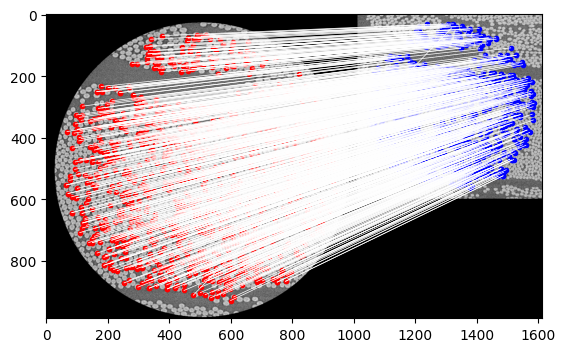

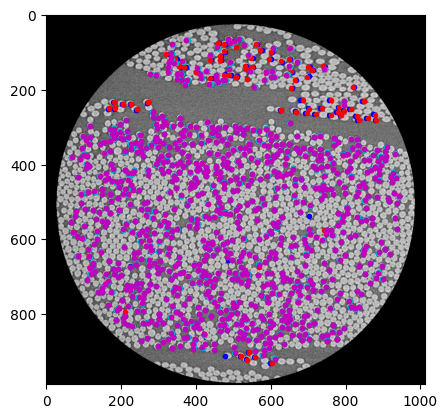

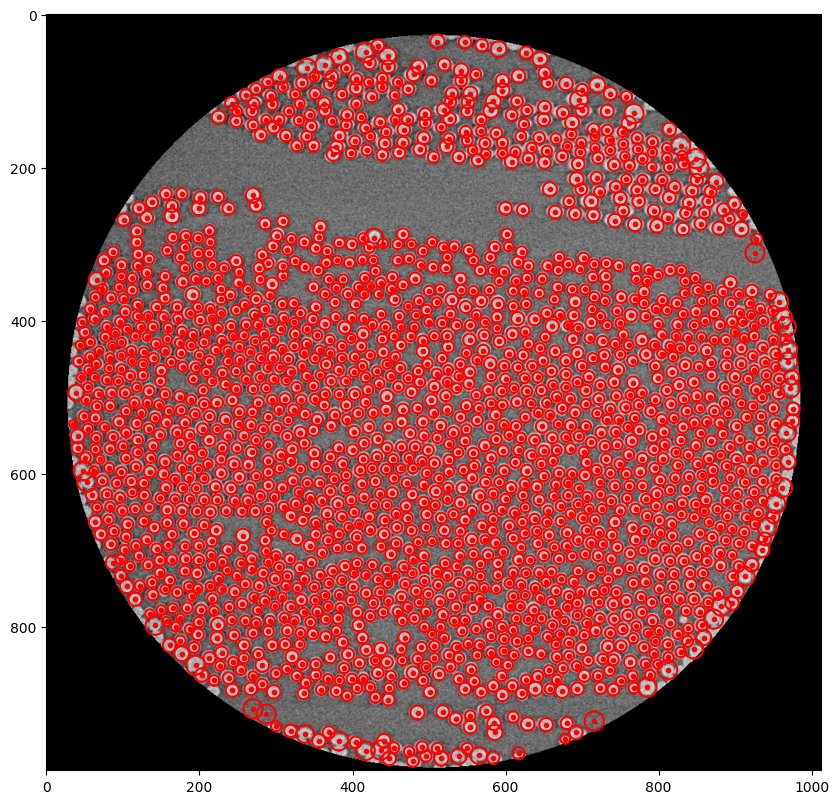

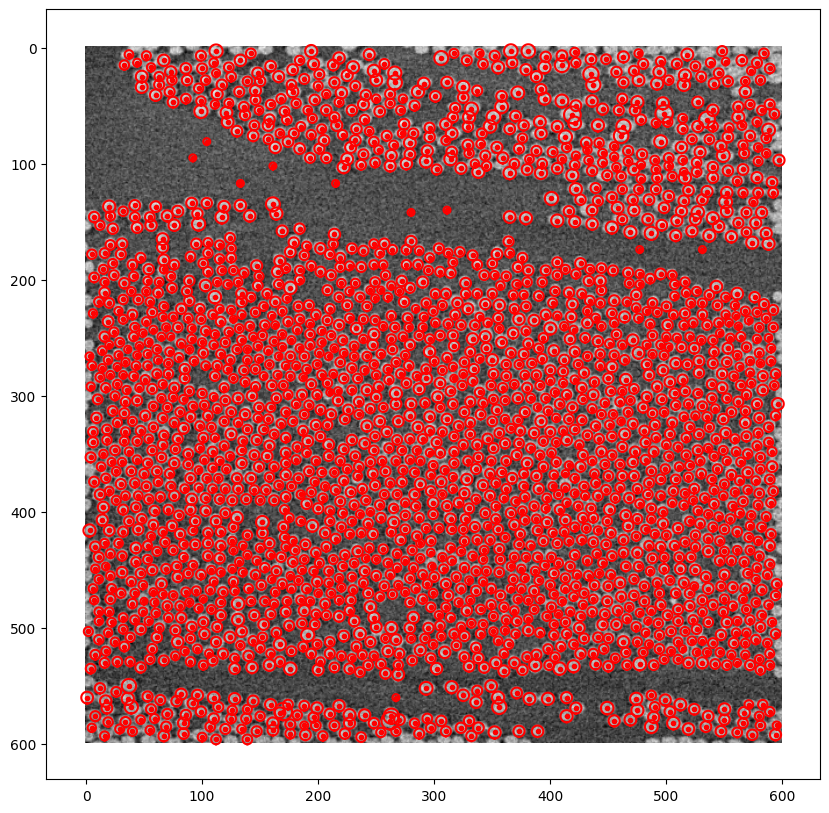

In [ ]:
#%% Compute the blobs in the two images and match them (optional part)
# I have read in two images, that I will match using SIFT, compute 
# blobs based on the exercise week 2, and compare the matched set 
# of blobs.


#%% Compute the transformation of detected fibers in one image to the other

im1 = cv2.imread(path + 'CT_lab_high_res.png',cv2.IMREAD_GRAYSCALE) # queryImage
im2 = cv2.imread(path + 'CT_lab_med_res.png',cv2.IMREAD_GRAYSCALE) # trainImage

pts_im1, pts_im2 = match_SIFT(im1, im2, 0.6)
plot_matching_keypoints(im1,im2,pts_im1, pts_im2)


R,t,s,idx = get_robust_transformation(pts_im2,pts_im1)

pts_im1_3 = s*R@pts_im2 + t

fig,ax = plt.subplots(1)
ax.imshow(im1, cmap = 'gray')
ax.plot(pts_im1[0],pts_im1[1],'.b')
ax.plot(pts_im1_3[0],pts_im1_3[1],'.r')
ax.plot(pts_im1[0,idx],pts_im1[1,idx],'.c')
ax.plot(pts_im1_3[0,idx],pts_im1_3[1,idx],'.m')

#%% Detect blobs in image 1

# Radius limit
diameterLimit = np.array([10,25])
stepSize = 0.3

# Parameter for Gaussian to detect center point
tCenter = 20

# Parameter for finding maxima over Laplacian in scale-space
thresMagnitude = 8

# Detect fibres
coord1, scale1 = detectFibers(im1.astype(np.float32), diameterLimit, stepSize, tCenter, thresMagnitude)

# Plot detected fibres
fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(im1, cmap='gray')
ax.plot(coord1[:,1], coord1[:,0], 'r.')
circ1_x, circ1_y = getCircles(coord1, scale1)
plt.plot(circ1_x, circ1_y, 'r')

#%% Detect blobs in image 2

# Radius limit
diameterLimit = np.array([6,15])
stepSize = 0.15

# Parameter for Gaussian to detect center point
tCenter = 6

# Parameter for finding maxima over Laplacian in scale-space
thresMagnitude = 10

# Detect fibres
coord2, scale2 = detectFibers(im2.astype(np.float32), diameterLimit, stepSize, tCenter, thresMagnitude)

# Plot detected fibres
fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(im2, cmap='gray')
ax.plot(coord2[:,1], coord2[:,0], 'r.')
circ2_x, circ2_y = getCircles(coord2, scale2)
plt.plot(circ2_x, circ2_y, 'r')


 ...]

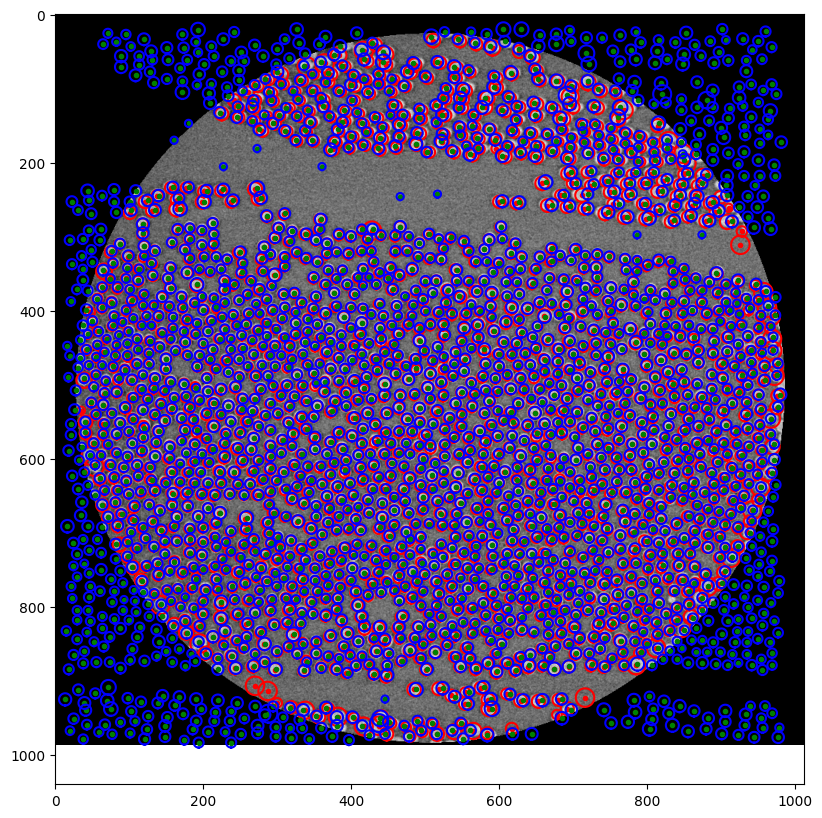

In [ ]:
#%% Transform the coordinates

# I have the blob detection as (row,col), but SIFT is as (x,y), so I need to reverse t
coord2_to_1 = (s*R@coord2.T + t[[1,0]]).T 
scale2_to_1 = s*s*scale2.T
circ2_to_1_x, circ2_to_1_y = getCircles(coord2_to_1, scale2_to_1)


# Plot detected fibres
fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(im1, cmap='gray')
ax.plot(coord1[:,1], coord1[:,0], 'r.')
ax.plot(circ1_x, circ1_y, 'r')
ax.plot(coord2_to_1[:,1], coord2_to_1[:,0], 'g.')
ax.plot(circ2_to_1_x, circ2_to_1_y, 'b')


Ttest_indResult(statistic=10.210828062238217, pvalue=3.774124055343573e-24)


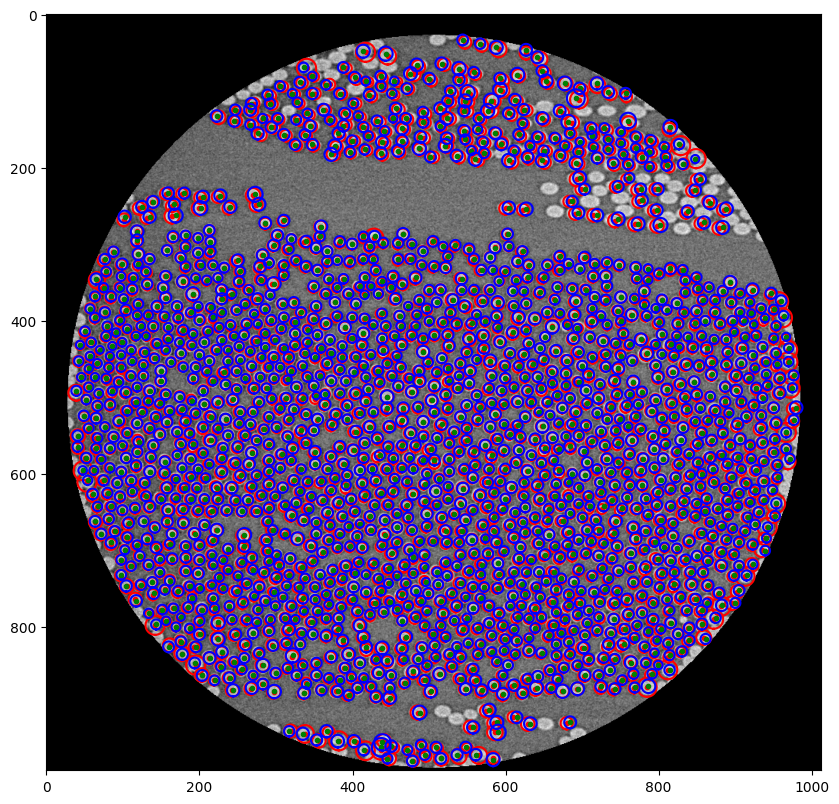

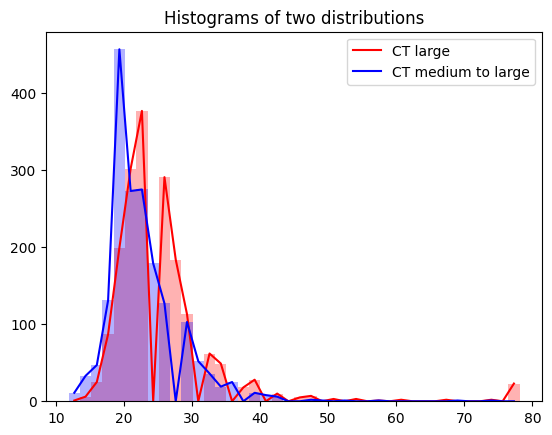

In [ ]:
#%% Find match within n pixels

def find_nearest(p,q,dd=3):
    idx_pq = np.zeros((p.shape[0]), dtype=np.int_)
    d_pq = np.zeros((p.shape[0])) + 10e10
    idx_qp = np.zeros((q.shape[0]), dtype=np.int_)
    for i in range(p.shape[0]):
        d = np.sum((q-p[i,:])**2,axis=1)
        idx_pq[i] = np.argmin(d)
        d_pq[i] = d[idx_pq[i]]
    for i in range(q.shape[0]):
        d = np.sum((p-q[i,:])**2,axis=1)
        idx_qp[i] = np.argmin(d)
    
    p_range = np.arange(0,p.shape[0])
    match = idx_qp[idx_pq] == p_range
    idx_p = p_range[match*(d_pq < dd**2)]
    
    idx_q = idx_pq[match*(d_pq < dd**2)]
    return idx_p, idx_q

idx_1,idx_2_to_1 = find_nearest(coord1, coord2_to_1,5)

# Plot detected fibres
fig, ax = plt.subplots(1,1,figsize=(10,10),sharex=True,sharey=True)
ax.imshow(im1, cmap='gray')
ax.plot(coord1[idx_1,1], coord1[idx_1,0], 'r.')
ax.plot(circ1_x[:,idx_1], circ1_y[:,idx_1], 'r')
ax.plot(coord2_to_1[idx_2_to_1,1], coord2_to_1[idx_2_to_1,0], 'g.')
ax.plot(circ2_to_1_x[:,idx_2_to_1], circ2_to_1_y[:,idx_2_to_1], 'b')


#%% t-test for if the two distributions are different (they are)
import scipy.stats
print(scipy.stats.ttest_ind(scale1[idx_1], scale2_to_1[idx_2_to_1]))

min_val = np.min(np.r_[scale1[idx_1], scale2_to_1[idx_2_to_1]])
max_val = np.max(np.r_[scale1[idx_1], scale2_to_1[idx_2_to_1]])
h1 = np.histogram(scale1[idx_1], bins=40, range=(min_val,max_val))
h2 = np.histogram(scale2_to_1[idx_2_to_1], bins=40, range=(min_val,max_val))

# x = np.arange(min_val,max_val,step=(max_val-min_val)/50)
fig, ax = plt.subplots(1)
plt.title('Histograms of two distributions')
ax.bar((h1[1][1:]+h1[1][:-1])/2,h1[0], width = h1[1][1]-h1[1][0],color='r',alpha=0.3)
ax.plot((h1[1][1:]+h1[1][:-1])/2,h1[0],'r')
ax.bar((h2[1][1:]+h2[1][:-1])/2,h2[0], width = h2[1][1]-h2[1][0],color='b',alpha=0.3)
ax.plot((h2[1][1:]+h2[1][:-1])/2,h2[0],'b')
ax.legend(('CT large','CT medium to large'))

## QUIZ WEEK 4

All three of the quiz questions are concerning the transformation between the following
two images: quiz_image_1.png and quiz_image_2.png.
1. What is the number of matched keypoints for the Lowe criterion of 0.5?
2. What is the magnification scale (i.e. the larger of the numbers s and 1/s)?
3. What is the absolute angle of the rotation in radians?


In [ ]:
path = './data/week4/' # Replace with your own path

im1 = cv2.imread(path + 'quiz_image_1.png',cv2.IMREAD_GRAYSCALE) # queryImage
im2 = cv2.imread(path + 'quiz_image_2.png',cv2.IMREAD_GRAYSCALE) # trainImage

# Initiate SIFT detector
sift = cv2.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(im1,None)
kp2, des2 = sift.detectAndCompute(im2,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    # Apply the Lowe criterion best should be closer than second best
    if m.distance/(n.distance + 10e-10) < 0.5:
        good.append([m])

print(f'number of matches: {len(good)}')

# Find coordinates
pts_im1 = [kp1[m[0].queryIdx].pt for m in good]
pts_im1 = np.array(pts_im1, dtype=np.float32).T
pts_im2 = [kp2[m[0].trainIdx].pt for m in good]
pts_im2 = np.array(pts_im2, dtype=np.float32).T

R,t,s,idx = get_robust_transformation(pts_im2,pts_im1)

print(f'{s=}, {1/s=}')

angle = np.arctan2(R[1, 0], R[0, 0])
print(f'Angle: {angle}')
angle2 = np.arccos(R[0, 0])
print(f'Absolute angle: {angle2}') # absolute angle


number of matches: 371
s=2.7148242, 1/s=0.3683479763143247
Angle: -2.740232958265355
Angle: 2.7402328681275057


# Image analysis with geometric priors

In image analysis, the terms prior knowledge and contextual information
refer to all the information about the problem that is available in addition
to the image data. This additional information may refer to some local
appearance (how bright, dark, smooth, textured. . . something is) or to
some geometric property (position, size, orientation, shape. . . of this
something)

# Markov random field
All MRF formulations
involve labeling, i.e. assigning labels to some entities, called sites. Typically, we are assigning labels to image pixels. MRFs are characterized
by the Markov property, i.e. that the probability of a site (pixel) being
assigned a certain label is only dependent on the neighborhood of the
site.

One characteristics of MRF, Markov-Gibbs equivalence following directly from Markov property, is that the probability of the MRF configuration is an exponential of the negative configuration energy. It is more
practical to work with energies, as energy contributions add up, while
probabilities multiply. Therefore, instead of maximizing the posterior
probability we will minimize the posterior energy of the configuration
f given by
$$
E(f) = U(f |d) = U(d| f) + U(f)
$$

where E(f) is a (segmentation) energy of the configuration f for a
certain data (image) d. Here, U(f |d) is a posterior energy and U(d| f)
is a likelihood energy.

Another important property of MRF is that both likelihood and prior
may be expressed as sums of local contributions called potentials. In the
exercise, we will work with so-called one-clique potentials (single pixels)
and two-clique potentials (pixel pairs). 
$$
E(f)=\sum_{\{i\} \in \mathcal{C}_1} V_1\left(f_i\right)+\sum_{\{i, j\} \in \mathcal{C}_2} V_2\left(f_i, f_j\right)
$$

where C1 is the set of one-cliques (for example single pixels), and V1
is a one-clique potential used for modeling the likelihood term, C2 is
the set of two-cliques (for example pixel pairs), and V2 is a two-clique
potential used for modeling the prior term.
As such MRF framework allows us to compute a (global) probability
of a whole configuration when some (local) property is modeled as a
sum of clique potentials

 di are intensities of the (noisy) image, fi are pixel labelings given
by the configuration, and values µ are estimated from the histogram
and set to µ1 = 70, µ2 = 130, µ3 = 190.

In [ ]:
def segmentation_energy(S, D, mu, beta):
    # TODO -- add your code here
    mu_ij =  np.choose(S, mu)

    # likelihood energy
    U1 = np.sum((mu_ij - D)**2)
    
    # prior energy
    delta_x = S[1:,:]!=S[:-1,:] # 1- delta(f(i),f(i-1))
    delta_y = S[:,1:]!=S[:,:-1]
    
    U2 = np.sum(beta*delta_x) + np.sum(beta*delta_y)
    
    return U1, U2

def segmentation_histogram(ax, D, S, edges=None):
    '''
    Plot histogram for grayscale data and each segmentation label.
    '''
    if edges is None:
        edges = np.linspace(D.min(), D.max(), 100)
    ax.hist(D.ravel(), bins=edges, color = 'k')
    centers = 0.5 * (edges[:-1] + edges[1:])
    for k in range(S.max() + 1):
        ax.plot(centers, np.histogram(D[S==k].ravel(), edges)[0])

Different segmentation methods

In [ ]:
path = './data/'
D = skimage.io.imread(path + 'noisy_circles.png').astype(float)

# Ground-truth segmentation.
GT = skimage.io.imread(path + 'noise_free_circles.png')
(mu, S_gt) = np.unique(GT, return_inverse=True)
S_gt = S_gt.reshape(D.shape)

segmentations = [S_gt]  # list where I'll place different segmentations

In [ ]:
# Simple thresholding
S_t = np.zeros(D.shape, dtype=int) + (D > 100) + (D > 160) # thresholded
segmentations += [S_t]

# Gaussian filtering followed by thresholding
D_s = scipy.ndimage.gaussian_filter(D, sigma=1, truncate=3, mode='nearest')
S_g = np.zeros(D.shape, dtype=int) + (D_s > 100) + (D_s > 160) 
segmentations += [S_g]

# Median filtering followed by thresholding
D_m = scipy.ndimage.median_filter(D, size=(5, 5), mode='reflect')
S_t = np.zeros(D.shape, dtype=int) + (D_m > 100) + (D_m > 160) # thresholded
segmentations += [S_t]

Calculate energy of each segmentation

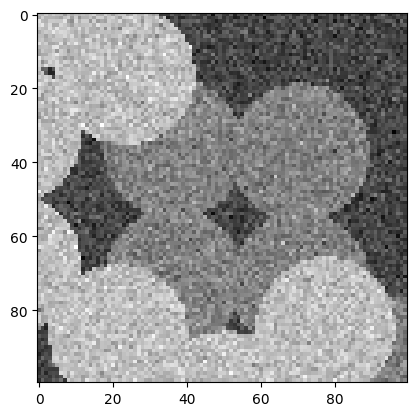

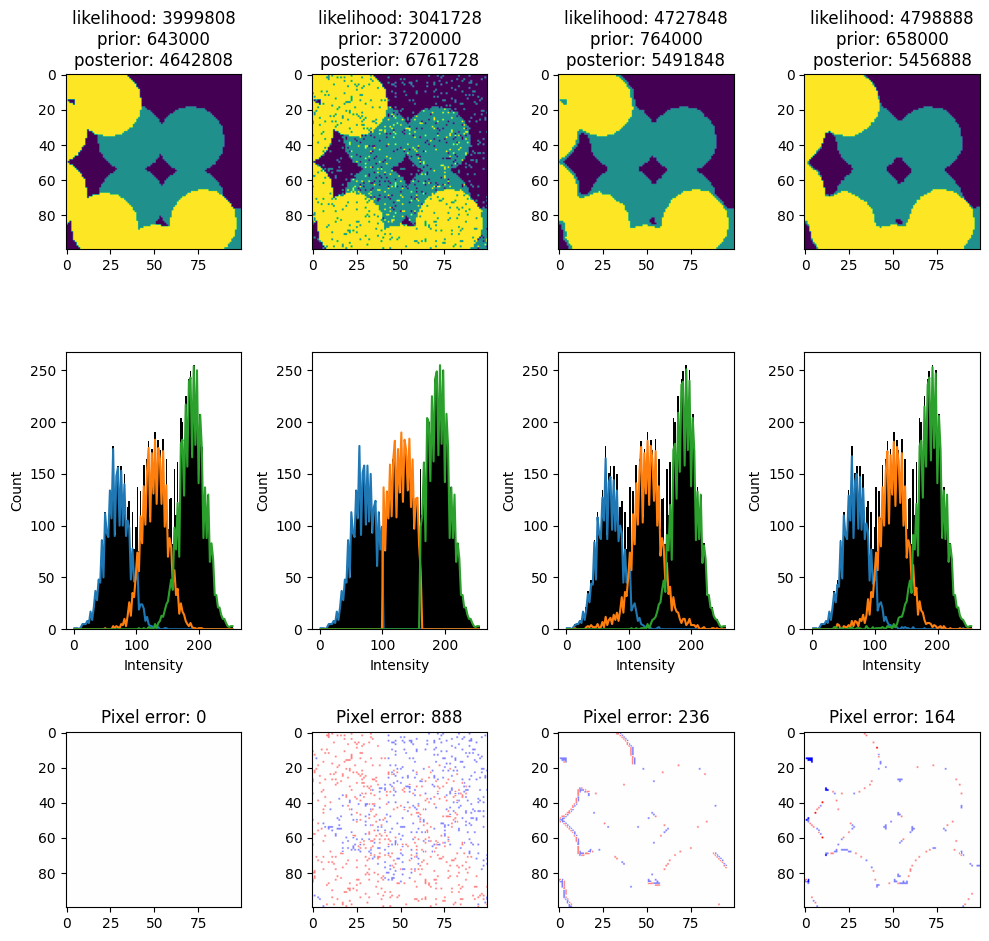

In [ ]:
#%% visualization
fig, ax = plt.subplots()
ax.imshow(D, vmin=0, vmax=255, cmap=plt.cm.gray)
plt.show()


fig, ax = plt.subplots(3, len(segmentations), figsize=(10, 10))
beta = 1000

for i, s in enumerate(segmentations):
    ax[0][i].imshow(s)

    U1, U2 = segmentation_energy(s, D, mu, beta)
    ax[0][i].set_title(f'likelihood: {int(U1)}\nprior: {U2}\nposterior: {int(U1)+U2}')
    
    segmentation_histogram(ax[1][i], D, s)
    ax[1][i].set_xlabel('Intensity')
    ax[1][i].set_ylabel('Count')
    
    err = S_gt - s
    ax[2][i].imshow(err, vmin=-2, vmax=2, cmap=plt.cm.bwr)
    ax[2][i].set_title(f'Pixel error: {(err != 0).sum()}')

fig.tight_layout()
plt.show()   

### Graph cuts for optimizing MRF
A binary (two label) MRF problem with submodular second order
energy (loosely speaking an energy favoring smoothness and having
only one-clique and two-clique potentials) can be exactly solved by
finding a minimum s-t cut of a graph constructed from the energy
function

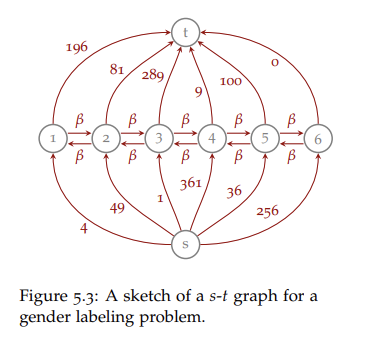

In [ ]:
import maxflow

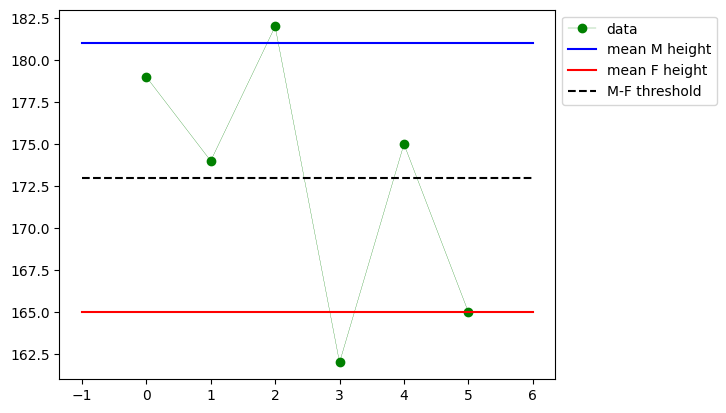

In [ ]:
d = np.array([179, 174, 182, 162, 175, 165]) # heights (data term)

mu = [181, 165] # means of two classes, used for computation of likelihood
w_s = (d - mu[0])**2 # source weight
w_t = (d - mu[1])**2 # sink weights

fig, ax = plt.subplots()
ax.plot(d, '-og', lw=0.2, label='data')
ax.plot([-1, len(d)], [mu[0]]*2, 'b', label='mean M height')
ax.plot([-1, len(d)], [mu[1]]*2, 'r', label='mean F height')
ax.plot([-1, len(d)], [0.5*(mu[0] + mu[1])]*2, '--k', label='M-F threshold')
ax.legend(bbox_to_anchor=(1, 1))
plt.show()

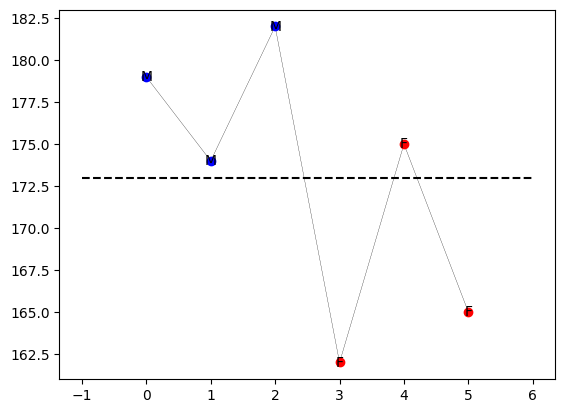

In [ ]:

beta = 150  # try changing between 0 and 1000

# Create a graph with integer capacities.


# Add (non-terminal) nodes and retrieve an index for each node.
nodes = g.add_nodes(len(d))

# Create edges between nodes.
for i in range(len(d)-1):
    g.add_edge(nodes[i], nodes[i+1], beta, beta)

# Set the capacities of the terminal edges.
for i in range(len(d)):
    g.add_tedge(nodes[i], (d[i]-mu[1])**2, (d[i]-mu[0])**2)

# Run the max flow algorithm.
flow = g.maxflow()

# Get the result as integer labels.
labeling = [g.get_segment(n) for n in nodes]

# Get the results as either 'M or 'F.
labeling_str = ['MF'[l] for l in labeling]

# Visualize
fig, ax = plt.subplots()
ax.plot([-1, len(d)], [0.5*(mu[0] + mu[1])]*2, '--k')
ax.plot(d, '-k', lw=0.2)g = maxflow.Graph[int]()
for i, di in enumerate(d):
    ax.plot(i, di, 'o'+'br'[labeling[i]])
    ax.text(i, di, labeling_str[i], ha='center', va='center')
plt.show()

## Binary segmentation using MRF

In [ ]:
path = './data/'
D = skimage.io.imread(path + 'DTU_noisy.png').astype(float)/255.0

# Ground-truth segmentation.
GT = skimage.io.imread(path + 'DTU.png')
(mu, S_gt) = np.unique(GT, return_inverse=True)
S_gt = S_gt.reshape(D.shape)

segmentations = [S_gt]  # list where I'll place different segmentations

mu1=0.35294117647058826, mu2=0.6666666666666666


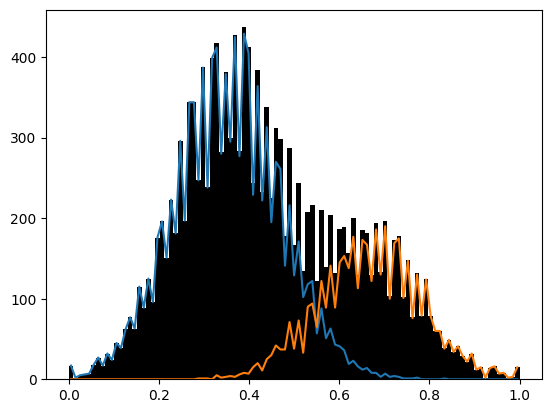

In [ ]:
mu1 = 90/255 
mu2 = 170/255

print(f'{mu1=}, {mu2=}')
fig, ax = plt.subplots()

segmentation_histogram(ax,D, S_gt)


Text(0.5, 1.0, 'Segmentation histogram')

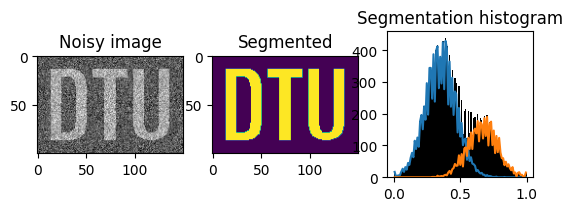

In [ ]:
# MRF parameters
beta  = 0.1
mu = [90/255, 170/255]

I=D 

# Setting up graph with internal and external edges
g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(I.shape)
g.add_grid_edges(nodeids, beta)
g.add_grid_tedges(nodeids, (I-mu[1])**2, (I-mu[0])**2)

#  Graph cut
g.maxflow()
S = g.get_grid_segments(nodeids)

# Visualization
fig, ax = plt.subplots(1, 3)
ax[0].imshow(I, vmin=0, vmax=1, cmap=plt.cm.gray)
ax[0].set_title('Noisy image')
ax[1].imshow(S)
ax[1].set_title('Segmented')
segmentation_histogram(ax[2], I, S, edges=None)
ax[2].set_aspect(1./ax[2].get_data_ratio())
ax[2].set_title('Segmentation histogram')

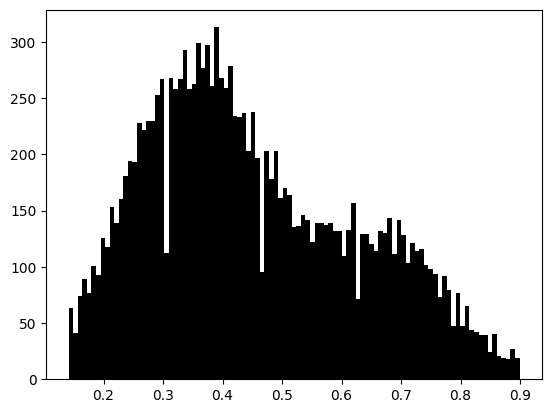

In [ ]:
path = './data/'
I = skimage.io.imread(path + 'V12_10X_x502.png').astype(float)/(2**16 - 1)

fig, ax = plt.subplots()


edges = np.linspace(I.min(), I.max(), 100)
ax.hist(D.ravel(), bins=edges, color = 'k')
centers = 0.5 * (edges[:-1] + edges[1:])



Text(0.5, 1.0, 'Segmentation histogram')

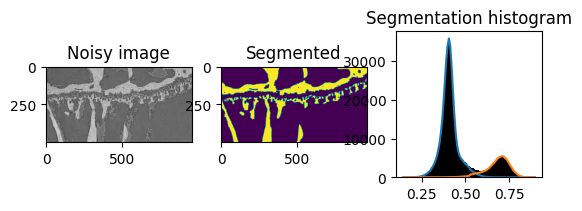

In [ ]:
# MRF parameters
beta  = 0.1
mu = [0.35, 0.7]


# Setting up graph with internal and external edges
g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(I.shape)
g.add_grid_edges(nodeids, beta)
g.add_grid_tedges(nodeids, (I-mu[1])**2, (I-mu[0])**2)

#  Graph cut
g.maxflow()
S = g.get_grid_segments(nodeids)

# Visualization
fig, ax = plt.subplots(1, 3)
ax[0].imshow(I, vmin=0, vmax=1, cmap=plt.cm.gray)
ax[0].set_title('Noisy image')
ax[1].imshow(S)
ax[1].set_title('Segmented')
segmentation_histogram(ax[2], I, S, edges=None)
ax[2].set_aspect(1./ax[2].get_data_ratio())
ax[2].set_title('Segmentation histogram')

Text(0.5, 1.0, 'segmentation histogram')

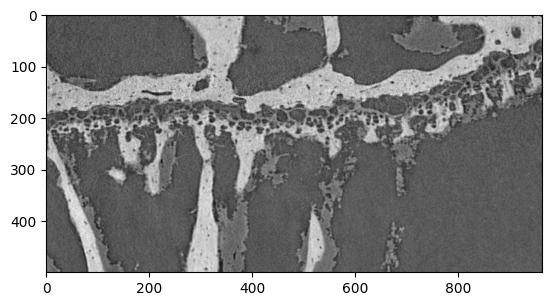

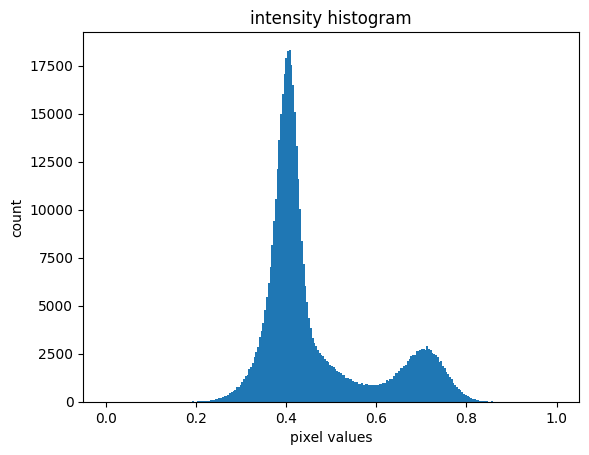

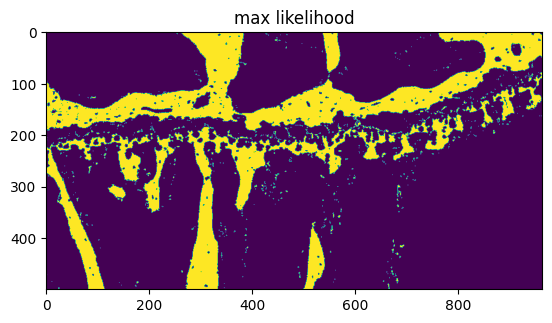

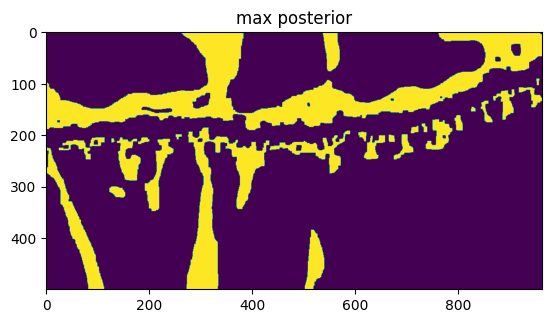

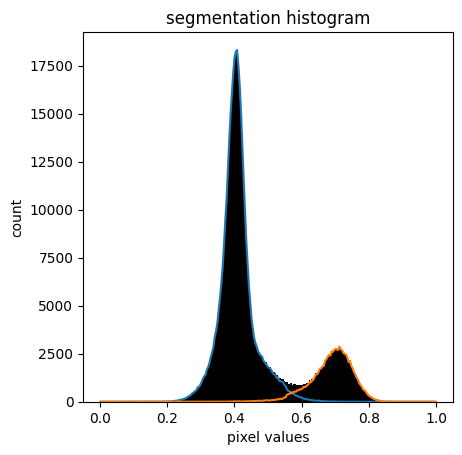

In [ ]:
#%% Inspect the image and the histogram
path = './data/'
I = skimage.io.imread(path + 'V12_10X_x502.png').astype(float)/(2**16-1)

fig, ax = plt.subplots()
ax.imshow(I, cmap=plt.cm.gray)

edges = np.linspace(0, 1, 257)
fig, ax = plt.subplots()
ax.hist(I.ravel(), edges)
ax.set_xlabel('pixel values')
ax.set_ylabel('count')
ax.set_title('intensity histogram')
#%% Define likelihood
mu = np.array([0.40, 0.71])
U = np.stack([(I-mu[i])**2 for i in range(len(mu))],axis=2)
S0 = np.argmin(U,axis=2)

fig, ax = plt.subplots()
ax.imshow(S0)
ax.set_title('max likelihood')

#%% Define prior, construct graph, solve
beta  = 0.1
g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(I.shape)
g.add_grid_edges(nodeids, beta)
g.add_grid_tedges(nodeids, U[:,:,1], U[:,:,0])

#  solving
g.maxflow()
S = g.get_grid_segments(nodeids)

fig, ax = plt.subplots()
ax.imshow(S)
ax.set_title('max posterior')

fig, ax = plt.subplots()
segmentation_histogram(ax, I, S, edges=edges)
ax.set_aspect(1./ax.get_data_ratio())
ax.set_xlabel('pixel values')
ax.set_ylabel('count')
ax.set_title('segmentation histogram')

## Quiz week 5

which is to be segmented into three segments: 1, 2 and 3. The segments are estimated
to have mean intensities µ1 = 2, µ2 = 5 and µ3 = 10. We use an MRF framework as
in the lecture note, and we choose to set β = 10.
1. What is the prior energy of the maximum likelihood solution?
2. What is the likelihood energy of the configuration where the leftmost two columns
are labeled as belonging to the segment 1, middle two columns are labeled as belonging to the segment 2, and rightmost two colums are labeled as belonging to
the segment 3?
3. What is the posterior energy of the maximum a posteriory solution? (Write the
smallest energy, which you could find.)

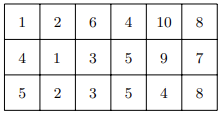

Likelihood: 21
prior_noisy 140


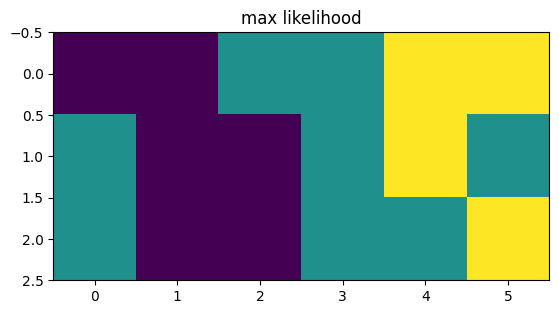

In [ ]:
img= np.array([[1,2,6,4,10,8], [4,1,3,5,9,7], [5,2,3,5,4,8]])

mu = np.array([2,5,10])
U = np.stack([(img-mu[i])**2 for i in range(len(mu))],axis=2)
S0 = np.argmin(U,axis=2)

fig, ax = plt.subplots()
ax.imshow(S0)
ax.set_title('max likelihood')

mu_ij =  np.choose(S0, mu)

# likelihood energy
U1 = np.sum((mu_ij - img)**2)

print(f'Likelihood: {U1}')

def prior_energy(S, beta):
    return beta * ((np.diff(S, axis=0)!=0).sum() + (np.diff(S, axis=1)!=0).sum()) 

prior_noisy = prior_energy(S0, beta=10)
print(f'prior_noisy {prior_noisy}')


In [ ]:
#2 What is the likelihood energy of the configuration where the leftmost two columns
#are labeled as belonging to the segment 1, middle two columns are labeled as belonging to the segment 2, and rightmost two colums are labeled as belonging to
#the segment 3?

MU_2=np.array([[ 2,  2,  5,  5, 10, 10],
       [ 2,  2,  5,  5, 10,  10],
       [ 2,  2,  5,  5,  10, 10]])

# likelihood energy
U1 = np.sum((MU_2 - img)**2)

print(f'Likelihood: {U1}')

  




Likelihood: 79


Text(0.5, 1.0, 'max posterior')

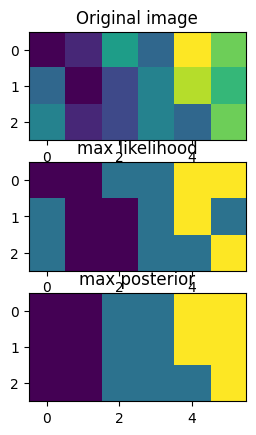

In [ ]:
#What is the posterior energy of the maximum a posteriory solution? (Write the smallest energy, which you could find.)

'''GT = skimage.io.imread(path + 'noise_free_circles.png') # ground truth
I = skimage.io.imread(path + 'noisy_circles.png')
mu = np.unique(GT) # instead of estimating
'''
I= np.array([[1,2,6,4,10,8], [4,1,3,5,9,7], [5,2,3,5,4,8]])

mu = np.array([2,5,10])
# converting all to float
I = I.astype(float)
mu = mu.astype(float)

beta = 10
D = np.stack([(I-mu[i])**2 for i in range(3)], axis=2)
V = beta - beta*np.eye(len(mu), dtype = D.dtype)

#%%
S0 = np.argmin(D, axis=2)
S = S0.copy()
maxflow.fastmin.aexpansion_grid(D, V, labels = S)

D0 = mu[S0]
D = mu[S] # denoised image using intensities from mu

fig, ax = plt.subplots(3, 1)
ax = ax.ravel()
ax[0].imshow(I)
ax[0].set_title('Original image')
ax[1].imshow(D0)
ax[1].set_title('max likelihood')
ax[2].imshow(D)
ax[2].set_title('max posterior')

Provided solution:

In [ ]:
#%%
import numpy as np
            
def prior_energy(S, beta):
    return beta * ((np.diff(S, axis=0)!=0).sum() + (np.diff(S, axis=1)!=0).sum())   

I = np.array([[1, 2, 6, 4, 10,  8],
              [4, 1, 3, 5, 9, 7],
              [5, 2, 3, 5, 4, 8]])
mu = np.array([2, 5, 10])
beta = 10

#%% Question 1
U = (np.stack([I-mu[0], I-mu[1], I-mu[2]], axis=2)**2).astype(int)
S0 = np.argmin(U, axis=2)
prior_noisy = prior_energy(S0, beta)
print(f'prior_noisy {prior_noisy}')

#%% Question 2

def likelihood_energy(S, I, mu):
    return ((mu[S] - I)**2).sum()

S = np.tile([0,0,1,1,2,2], (3,1)).astype(int)
likelihood_stripes = likelihood_energy(S, I, mu);
print(f'likelihood_stripes {likelihood_stripes}')

#%% Question 3 - Getting postetrior energy direcly from the solution
S_MAP = np.array([[0, 0, 1, 1, 2, 2],
                  [0, 0, 1, 1, 2, 2],
                  [0, 0, 1, 1, 1, 2]])
posterior_small  = prior_energy(S_MAP, beta) + likelihood_energy(S_MAP, I, mu)
print(f'posterior_small {posterior_small}')

#%% Question 3 - computing MAP using graph cuts
import maxflow.fastmin
S_GC = S0.copy()
maxflow.fastmin.aexpansion_grid(U, beta - 
                            beta*np.eye(3, 3, dtype=U.dtype), labels = S_GC)
posterior_GC  = prior_energy(S_GC, beta) + likelihood_energy(S_GC, I, mu)
print(f'posterior_GC {posterior_GC}')


prior_noisy 140
likelihood_stripes 79
posterior_small 114
posterior_GC 114


# Deformable models

Often, image segmentation involves a combination of two terms:
one dealing with the image data and the other describing a desirable
segmentation. For example, we have used Markov random fields to
impose smoothness on the segmentation. The topic of this chapter,
deformable models for image segmentation, is another strategy which
combines two contributions: the first originating from the image, and
the second imposing smoothness.

The curve moves under
the influence of *external forces*, which are computed from the image
data, and *internal forces* which have to do with the curve itself. Deformable models are generally classified as either parametric (also
called explicit) or implicit (in the context of image segmentation also
called geometric), depending on the method used for representing the
curve,

In the exercise for this chapter, we use parametric curve representation, often called a snake, C(s) = (x(s), y(s)) where parameter s ∈ [0, 1] is an arclength. In a discrete setting, this becomes a sequence of points (xs, ys), and parameter s becomes a discrete index
s = {1, . . . , n} indicating ordering of the points. It is convinient to
represent such a curve using an n × 2 array (matrix) of numbers (coordinates).


Here, we use $E_{ext}$ to denote
external energy, which is a contribution to the segmentation energy
determined by image data. And we use $E_{int}$ for internal energy, which
has to do with the curve itself. A segmentation is obtained by iteratively moving the curve to minimize the energy, and the most challenging part of the approach is
deriving energy-minimizing curve deformation forces F = −∇E. Since
energy may be broken in two contributions, the forces also have two
terms, F = Fext + Fint.


To allow deformation, the curve is made dynamic (time-dependable), and its change in time, often denoted evolution, is given by
$$
\frac{\partial C}{\partial t}=F(C) \text {. }
$$
This exercise is inspired by the Chan-Vese algorithm 3, a deformable model for image segmentation which minimizes a piecewise-constant Mumford-Shah functional. In the original formulation, Chan-Vese uses a implicit (level-set) curve representation and a two-step optimization. We will use the solution of the Chan-Vese approach, but, instead of using level-sets, we will combine it with a parametric curve representation. For this reason, even though our model has an external energy identical to the one used by the Chan-Vese algorithm, the internal energy we use is the same as what is used for snakes.

In the following two sections, we briefly cover first the external, and then the internal energy. The detailed explanation on how external forces are derived from external energy can be found in the ChanVese article. How internal forces are derived is explained in Chapter 3 of the Handbook of Medical Imaging, Image Segmentation Using Deformable Models 4, subsection 3.2.1 and 3.2.4. Recall that you already implemented curve smoothing as one of the introductory exercises during the first week of the course.

### External energy, Chan-Vese
An external energy closely related to the two-phase piecewise constant Mumford-Shah model is
$$
E_{\mathrm{ext}}=\int_{\Omega_{\mathrm{in}}}\left(I-m_{\mathrm{in}}\right)^2 d \omega+\int_{\Omega_{\mathrm{out}}}\left(I-m_{\mathrm{out}}\right)^2 d \omega
$$
where $I$ is an image intensity as a function of the pixel position, while $m_{\text {in }}$ and $m_{\text {out }}$ are mean intensities of the inside and the outside region. This energy seeks the best (in a squared-error sense) piecewise constant approximation of I. An evolution that will deform a curve toward an energy minimum is derived as
$$
F_{\text {ext }}=\left(m_{\text {in }}-m_{\text {out }}\right)\left(2 I-m_{\text {in }}-m_{\text {out }}\right) N .
$$
where $N$ denotes an outward unit normal of the curve.
In other words, the curve deforms in the normal direction, and for every point on the curve we only need to compute the (signed) length of the displacement. We will denote the scalar components of the force as $f_{\text {ext }}=\left(m_{\text {in }}-m_{\text {out }}\right)\left(2 I-m_{\text {in }}-m_{\text {out }}\right)$. Note that this can be written as $f_{\text {ext }}=2\left(m_{\text {in }}-m_{\text {out }}\right)\left(I-\frac{1}{2}\left(m_{\text {in }}+m_{\text {out }}\right)\right)$, i.e. the signed length of displacement is proportional to the difference between the image intensities and the mean of $m_{\text {in }}$ and $m_{\text {out }}$.
### Internal forces, snakes
The internal energy is determined solely by the shape of the curve. In the classical snakes formulation internal forces discourage stretching and bending of the curve
$$
E_{\text {int }}=\frac{1}{2} \int_0^1 \alpha\left|\frac{\partial C}{\partial s}\right|^2+\beta\left|\frac{\partial^2 C}{\partial s^2}\right|^2 d s
$$
with weights $\alpha$ and $\beta$ controlling the elasticity (first-order derivative) and the rigidity (second-order derivative) term. Corresponding deformation forces are
$$
F_{\text {int }}=\frac{\partial}{\partial s}\left(\alpha \frac{\partial C}{\partial s}\right)-\frac{\partial^2}{\partial s^2}\left(\beta \frac{\partial^2 C}{\partial s^2}\right) \text {. }
$$
Those internal (regulatory) forces are the key to success of deformable models, as they provide robustness to noise.

Since our snake is discrete, the derivatives should be approximated by finite differences. Applying internal forces (regularization) now corresponds to filtering (smoothing) the curve with filters for the second and the (negative) fourth derivative, i.e. the filter $\left[\begin{array}{ccc}1 & -2 & 1\end{array}\right]$ and the filter $\left[\begin{array}{ccccc}-1 & 4 & -6 & 4 & -1\end{array}\right]$. Those contributions, weighted by parameters $\alpha$ and $\beta$ are now used to regularize (smooth) the curve. In efficient implementation this is done by a matrix multiplication, and for better stability we use a backward Euler scheme. For slightly more detail, you can revise the introductory exercise on curve smoothing 1.1.3-
### Final model
For a snake consisting of $n$ points and represented using an $n \times 2$ matrix C, a final discrete update step is, adapted from Handbook of Medical Imaging, Eq. (3.22),
$$
\mathbf{C}^t=\mathbf{B}_{\text {int }}\left(\mathbf{C}^{t-1}+\tau \operatorname{diag}\left(\mathbf{f}_{\text {ext }}\right) \mathbf{N}^{t-1}\right) .
$$

In this expression τ is the time step for displacement, while Bint is the
n × n matrix used for regularizing the curve and taking the role of
the internal forces. Curve normals are represented as an n × 2 matrix
N, and pointwise displacement is obtained by multiplying N with a
n × n diagonal matrix containing the displacement lengths. Note that
the multiplication with matrix diag(fext) is simpler to implement as a
row-wise multiplication with a vector fext.


## Segmentation and tracking

We will use a deformable model to segment and track a simple organism
in a sequence of images

In [3]:
#SNAKE FUNCTIONS

def distribute_points(snake):
    """ Distributes snake points equidistantly. Expects snake to be 2-by-N array."""
    N = snake.shape[1]
    d = np.sqrt(np.sum((np.roll(snake, -1, axis=1)-snake)**2, axis=0)) # length of line segments
    f = scipy.interpolate.interp1d(np.r_[0, np.cumsum(d)], np.c_[snake, snake[:,0:1]])
    return(f(sum(d)*np.arange(N)/N))

def is_crossing(p1, p2, p3, p4):
    """ Check if the line segments (p1, p2) and (p3, p4) cross."""
    crossing = False
    d21 = p2 - p1
    d43 = p4 - p3
    d31 = p3 - p1
    det = d21[0]*d43[1] - d21[1]*d43[0] # Determinant
    if det != 0.0 and d21[0] != 0.0 and d21[1] != 0.0:
        a = d43[0]/d21[0] - d43[1]/d21[1]
        b = d31[1]/d21[1] - d31[0]/d21[0]
        if a != 0.0:
            u = b/a
            if d21[0] > 0:
                t = (d43[0]*u + d31[0])/d21[0]
            else:
                t = (d43[1]*u + d31[1])/d21[1]
            crossing = 0 < u < 1 and 0 < t < 1         
    return crossing

def is_counterclockwise(snake):
    """ Check if points are ordered counterclockwise."""
    return np.dot(snake[0,1:] - snake[0,:-1],
                  snake[1,1:] + snake[1,:-1]) < 0

def remove_intersections(snake):
    """ Reorder snake points to remove self-intersections.
        Arguments: snake represented by a 2-by-N array.
        Returns: snake.
    """
    pad_snake = np.append(snake, snake[:,0].reshape(2,1), axis=1)
    pad_n = pad_snake.shape[1]
    n = pad_n - 1 
    
    for i in range(pad_n - 3):
        for j in range(i + 2, pad_n - 1):
            pts = pad_snake[:,[i, i + 1, j, j + 1]]
            if is_crossing(pts[:,0], pts[:,1], pts[:,2], pts[:,3]):
                # Reverse vertices of smallest loop
                rb = i + 1 # Reverse begin
                re = j     # Reverse end
                if j - i > n // 2:
                    # Other loop is smallest
                    rb = j + 1
                    re = i + n                    
                while rb < re:
                    ia = rb % n
                    rb = rb + 1                    
                    ib = re % n
                    re = re - 1                    
                    pad_snake[:,[ia, ib]] = pad_snake[:,[ib, ia]]                    
                pad_snake[:,-1] = pad_snake[:,0]                
    snake = pad_snake[:,:-1]
    if is_counterclockwise(snake):
        return snake
    else:
        return np.flip(snake, axis=1)
    


def make_circular_snake(N, center, radius):
    """ Initialize circular snake as a 2-by-N array."""
    center = center.reshape([2,1])
    angles = np.arange(N)*2*np.pi/N
    return(center+radius*np.array([np.cos(angles), np.sin(angles)]))


def normalize(n):
    return n/np.sqrt(np.sum(n**2,axis=0))


def snake_normals(snake):
    """ Returns snake normals. Expects snake to be 2-by-N array."""
    ds = normalize(np.roll(snake, 1, axis=1) - snake) 
    tangent = normalize(np.roll(ds,-1,axis=1) + ds)
    normal = tangent[[1,0],:]*np.array([-1,1]).reshape([2,1])
    return(normal)


  
    
def keep_snake_inside(snake, shape):
    """ Contains snake insite the image."""
    snake[snake<0]=0
    snake[0][snake[0]>shape[0]-1] = shape[0]-1 
    snake[1][snake[1]>shape[1]-1] = shape[1]-1 
    return snake

    
def regularization_matrix(N, alpha, beta):
    """ Matrix for smoothing the snake."""
    d = alpha*np.array([-2, 1, 0, 0]) + beta*np.array([-6, 4, -1, 0])
    D = np.fromfunction(lambda i,j: np.minimum((i-j)%N,(j-i)%N), (N,N), dtype=int)
    A = d[np.minimum(D,len(d)-1)]
    return(scipy.linalg.inv(np.eye(N)-A))


def evolve_snake(snake, I, B, step_size):
    """ Single step of snake evolution."""
    mask = skimage.draw.polygon2mask(I.shape, snake.T)
    m_in = np.mean(I[mask])
    m_out = np.mean(I[~mask])
      
    f = scipy.interpolate.RectBivariateSpline(np.arange(I.shape[0]), np.arange(I.shape[1]), I)
    val = f(snake[0],snake[1], grid=False)
    # val = I[snake[0].astype(int), snake[1].astype(int)] # simpler variant without interpolation
    force = 0.5*(m_in-m_out)*(2*val - (m_in+m_out))
    snake += step_size*force*snake_normals(snake) # external part
    snake = np.dot(snake, B) # internal part, ordering influenced by 2-by-N representation of snake
    snake = remove_intersections(snake)
    snake = distribute_points(snake)
    snake = keep_snake_inside(snake, I.shape)
    return snake

 For the
movie showing the crawling amoeba (which is white on a dark background), it is enough to convert movie frames to grayscale images.
Transforming intensities to doubles between 0 and 1 is advisable, as
it might prevent issues in subsequent processing.

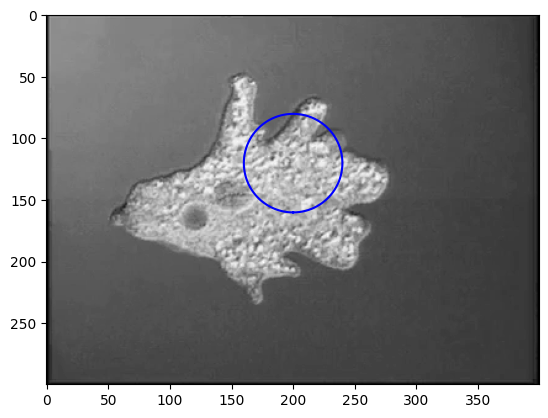

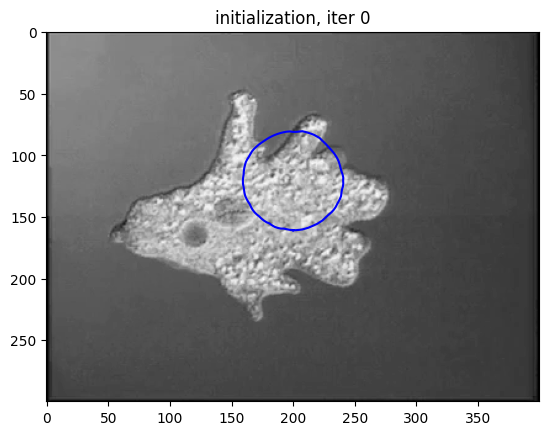

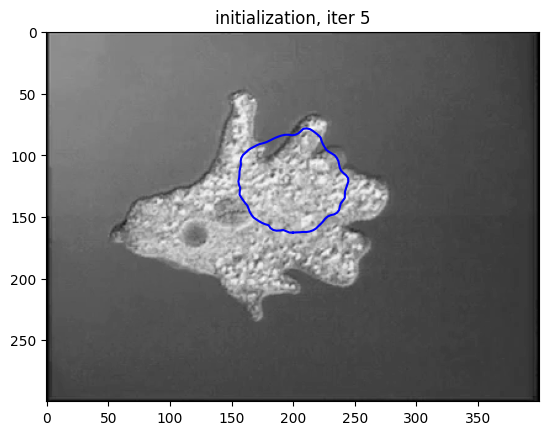

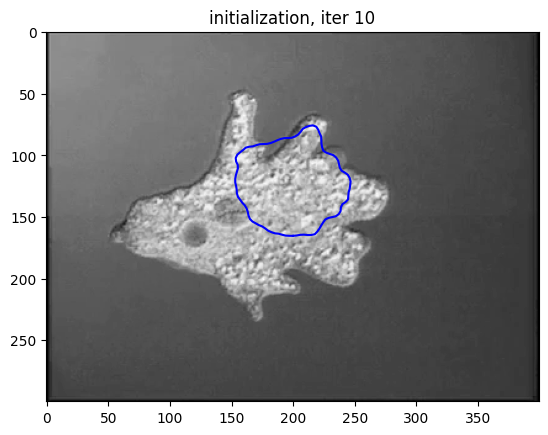

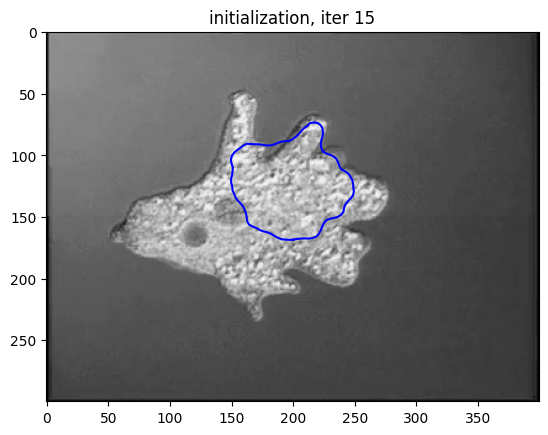

...

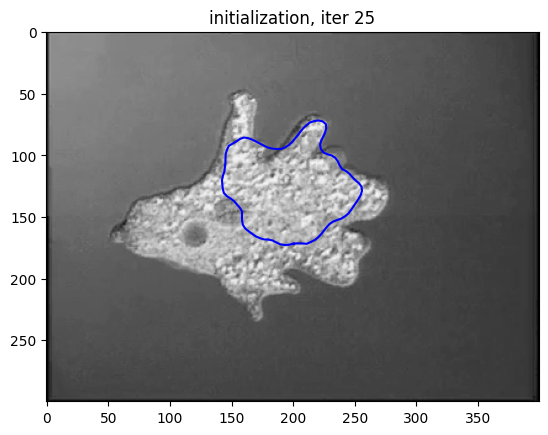

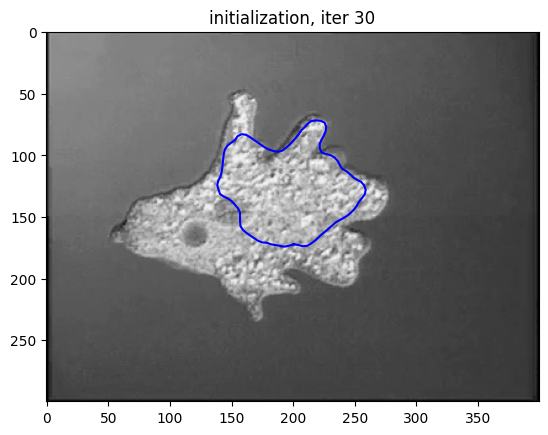

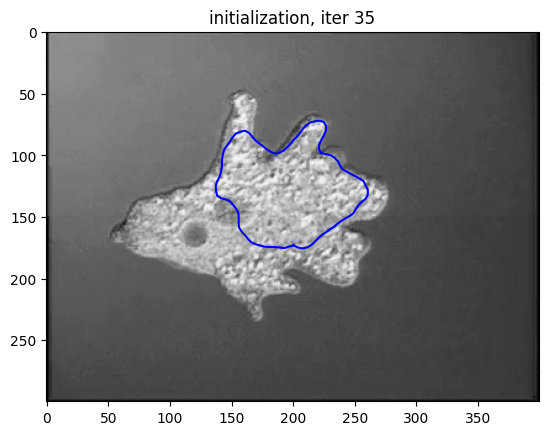

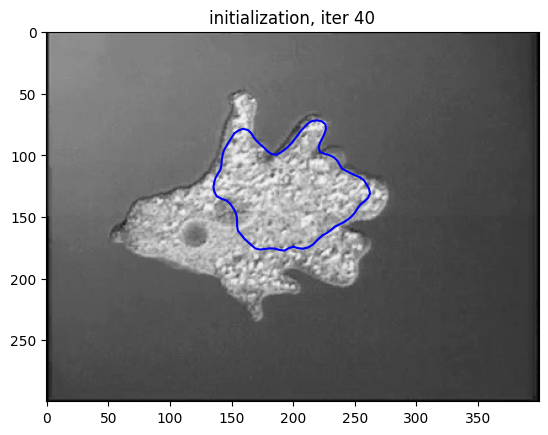

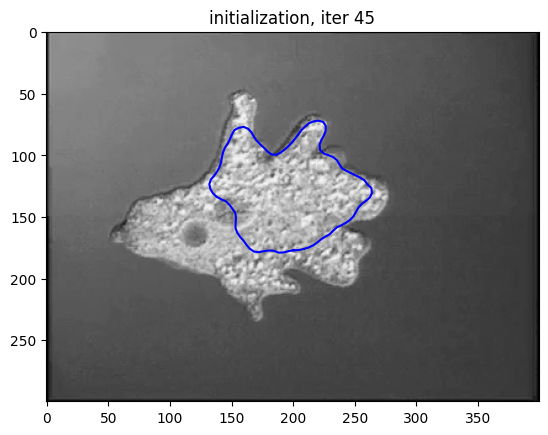

In [4]:
#tracking amoeba

import imageio

filename = './data/crawling_amoeba.mov'
vid = imageio.get_reader(filename)
movie = np.array([im for im in vid.iter_data()], dtype=float)/255
movie = np.mean(movie, axis=3)

#%% settings
nr_points = 100
step_size = 10
alpha = 0.1
beta = 0.1
center = np.array([120,200])
radius = 40

#%% initialization
snake = make_circular_snake(nr_points, center, radius)
B = regularization_matrix(nr_points, alpha, beta)
frame = movie[0]
fig, ax = plt.subplots()
ax.imshow(frame, cmap='gray')
ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'b-')

for i in range(50):    
    snake = evolve_snake(snake, frame, B, step_size)    
    if i%5==0:
        fig, ax = plt.subplots()
        ax.imshow(frame, cmap='gray')
        ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'b-')
        ax.set_title(f'initialization, iter {i}')
        plt.show()



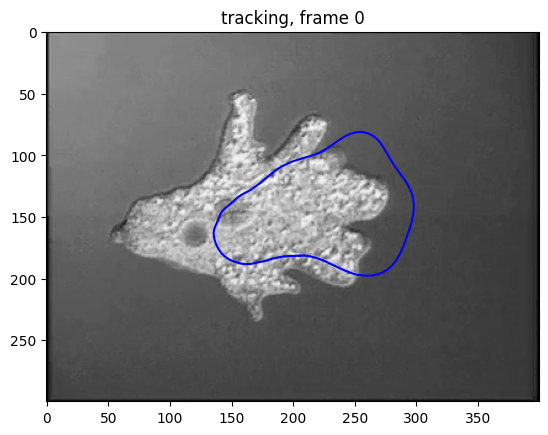

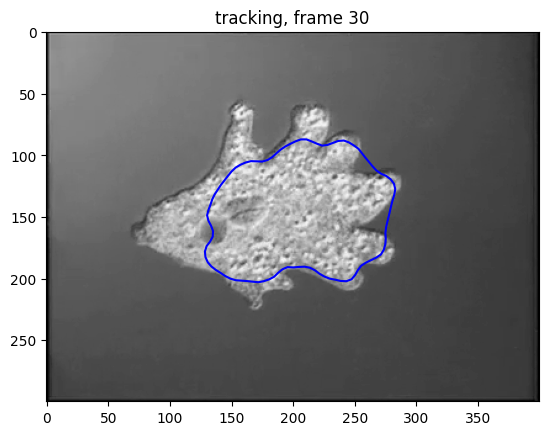

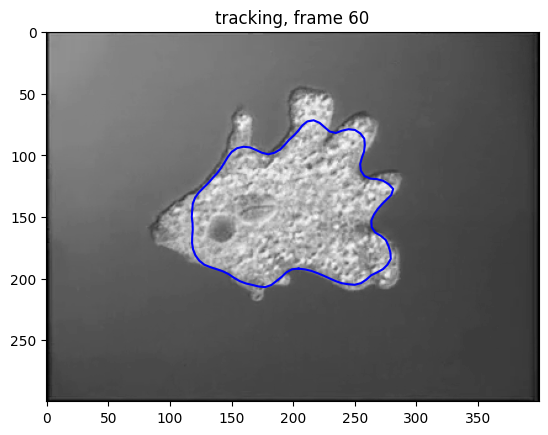

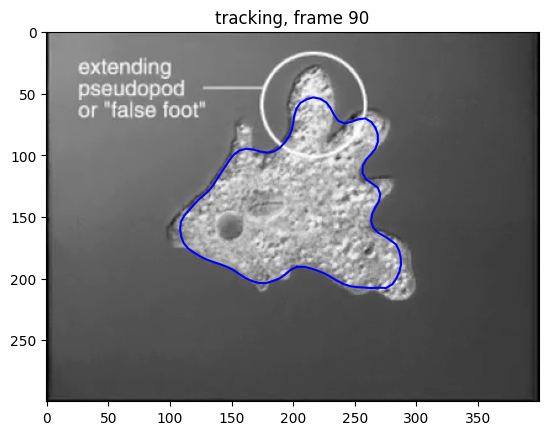

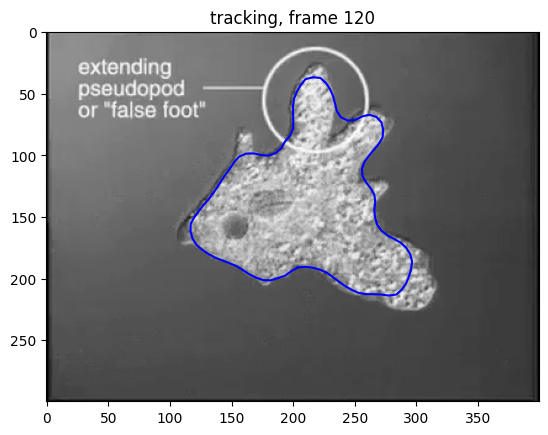

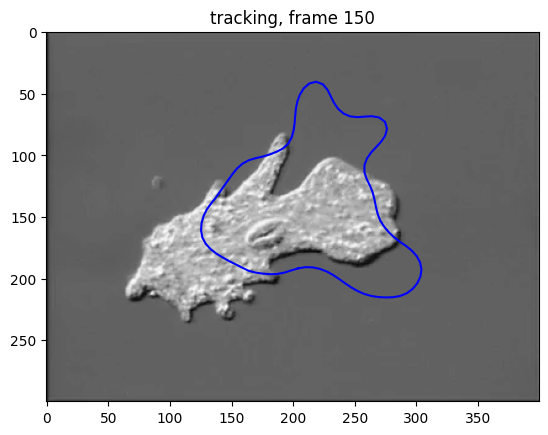

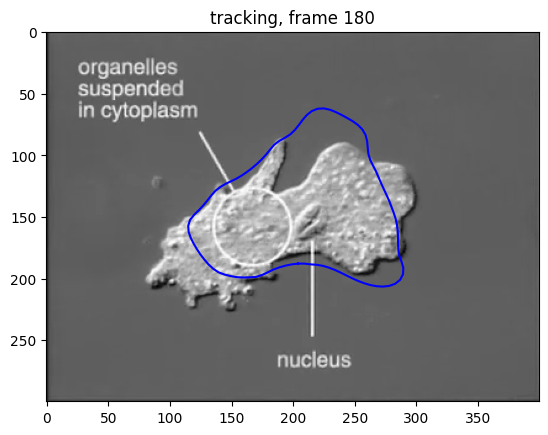

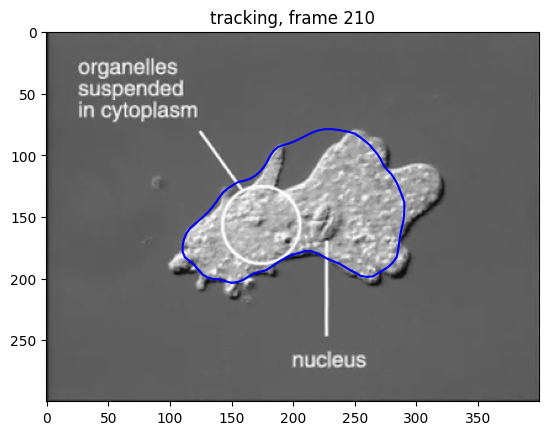

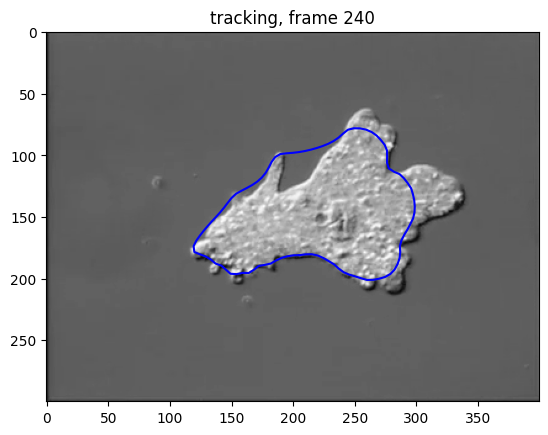

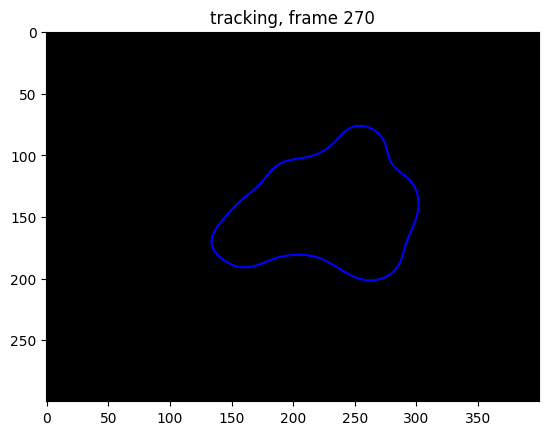

In [8]:
'''#%% tracking
for i in range(0,500):
    frame = movie[i] 
    snake = evolve_snake(snake, frame, B, step_size)    
    ax.clear()
    ax.imshow(frame, cmap='gray')
    ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'b-')
    ax.set_title(f'tracking, frame {i}')
    plt.pause(0.001)'''

#%% tracking
for i in range(0,300):
    frame = movie[i] 
    snake = evolve_snake(snake, frame, B, step_size)    
    if i%30==0:
        fig, ax = plt.subplots()
        ax.imshow(frame, cmap='gray')
        ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'b-')
        ax.set_title(f'tracking, frame {i}')
        plt.show()


For the movie of
the echinicsus, we want to utilize the fact that foreground is yellow
while background is blue. A example of suitable transformation is
(2b − (r + g) + 2)/4, with r, g, b being color channels (with values
between 0 and 1) of movie frames

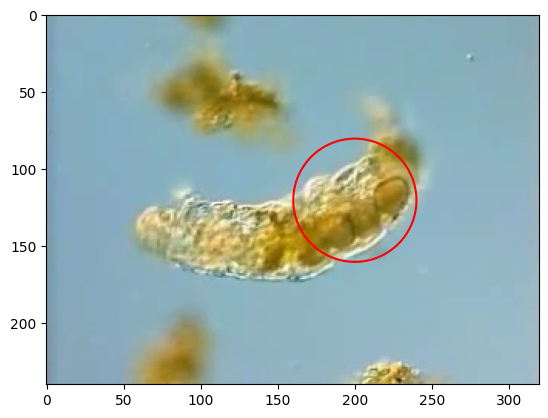

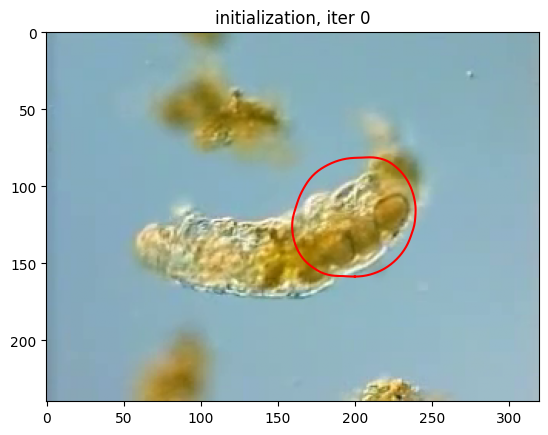

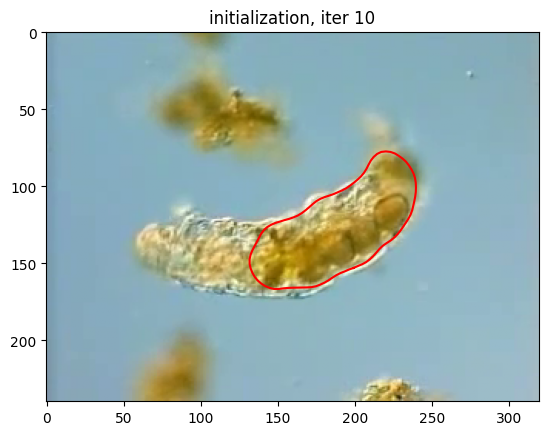

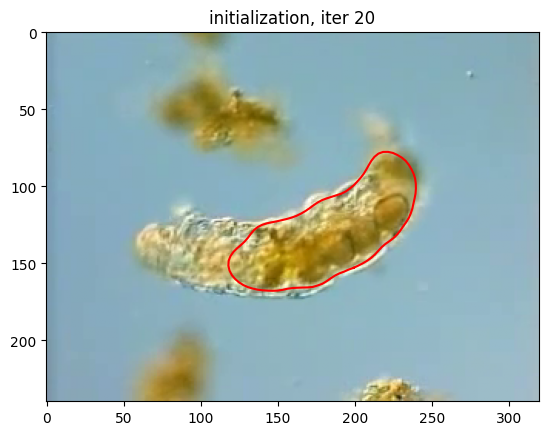

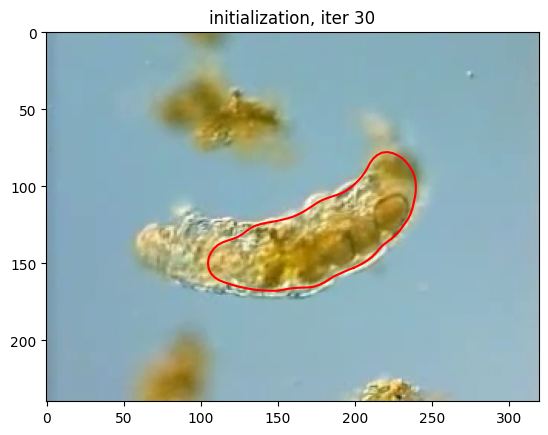

...

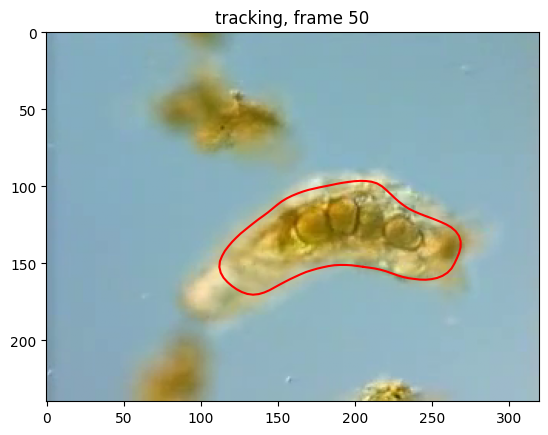

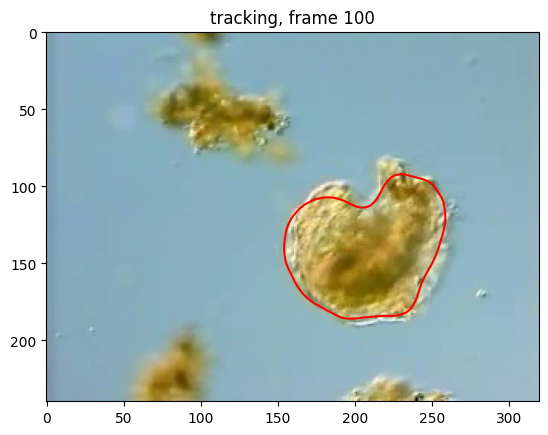

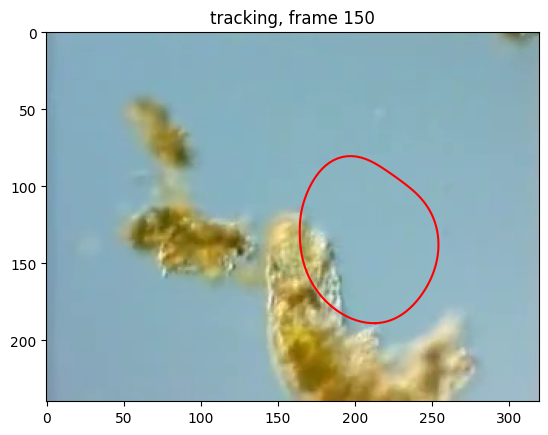

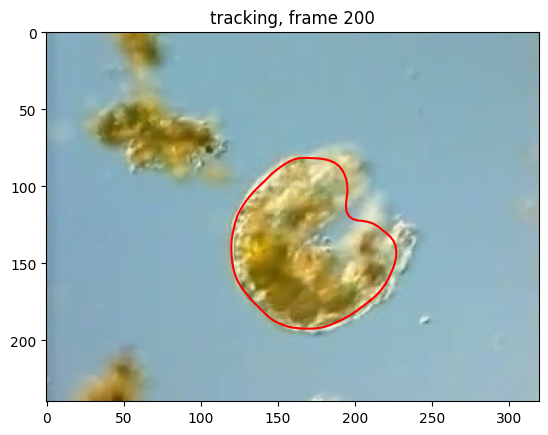

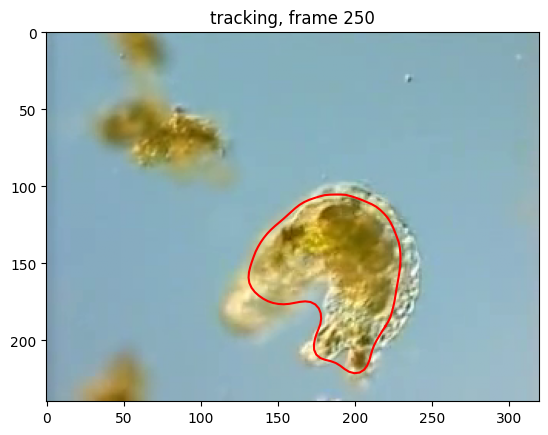

In [14]:
#tracking water bear
filename = './data/echiniscus.mp4'
vid = imageio.get_reader(filename)
movie = np.array([im for im in vid.iter_data()], dtype=float)/255
gray = (2*movie[:,:,:,2] - movie[:,:,:,1]- movie[:,:,:,0]+2)/4 #(2b − (r + g) + 2)/4, with r, g, b


#%% settings
nr_points = 100
step_size = 100
alpha = 0.8
beta = 0.1
center = np.array([120,200])
radius = 40
start_frame = 74

#%% initialization
snake = make_circular_snake(nr_points, center, radius)
B = regularization_matrix(nr_points, alpha, beta)
g = gray[start_frame] # image we operate on
m = movie[start_frame] # image we display
fig, ax = plt.subplots()
ax.imshow(m, cmap='gray')
ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'r-')

for i in range(50):    
    snake = evolve_snake(snake, g, B, step_size)    
    if i%10==0:
        fig, ax = plt.subplots()
        ax.imshow(m, cmap='gray')
        ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'r-')
        ax.set_title(f'initialization, iter {i}')
        plt.show()
  
      
#%% tracking
for i in range(0,300):
    m = movie[start_frame + i] # 2 evolution steps per frame
    g = gray[start_frame + i]
    snake = evolve_snake(snake, g, B, step_size)    
        
    if i%50==0:
        fig, ax = plt.subplots()
        ax.imshow(m, cmap='gray')
        ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'r-')
        ax.set_title(f'tracking, frame {i}')
        plt.show()


## Quiz week 6
1. Consider modifying Equation (6.3) from the lecture notes by removing internal
forces and making all scalar components of external forces equal to 1, such that
you are left with
$$C^t = C^{t−1} + N^{t−1}$$

Assume you initialize a circular snake with a radius of 100 pixels and iteratively
evolve the snake 10 times. What is the area of Ωin (measured in square pixels)?

2. Consider the image plusplus.png with data type transformed to double precision by dividing all pixel intensities with 255. Initialize a circular snake with
a radius of 120 pixels in the centre of the image. Consider now a snake point,
positioned where image intensity is 0.8. What is the value of fext affecting this
point?

3. For the same image and the same curve, what is the value of Eext according to
the first equation in the Section 6.1 of the course note?

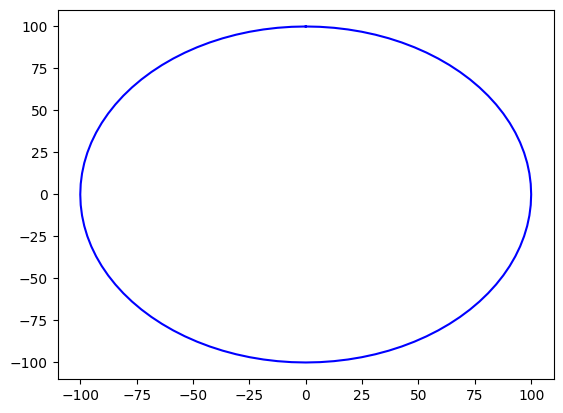

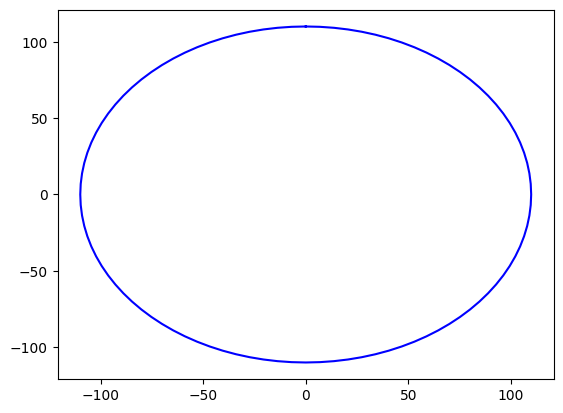

In [19]:
#1

#%% settings
nr_points = 100
step_size = 10
alpha = 0.1
beta = 0.1
center = np.array([0,0])
radius = 100

#%% initialization
snake = make_circular_snake(nr_points, center, radius)


fig, ax = plt.subplots()
ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'b-')

for i in range(10):    
      

    # val = I[snake[0].astype(int), snake[1].astype(int)] # simpler variant without interpolation
    #force = 0.5*(m_in-m_out)*(2*val - (m_in+m_out))
    #snake += step_size*force*snake_normals(snake) # external part
    snake += snake_normals(snake)
    snake = remove_intersections(snake)
    snake = distribute_points(snake)

fig, ax = plt.subplots()
ax.plot(np.r_[snake[1],snake[1,0]],np.r_[snake[0],snake[0,0]],'b-')


In [25]:
# Append the first point at the end
snake_find_area = np.hstack((snake, snake[:, 0].reshape(2, 1)))

# Apply the shoelace formula
area = 0.5 * np.abs(np.dot(snake_find_area[0, :-1], snake_find_area[1, 1:]) - np.dot(snake_find_area[1, :-1], snake_find_area[0, 1:]))

print("Area:", area)

Area: 37988.26431523456


In [44]:
#OR since it increases radius one pixel per step
import numpy as np
print(np.pi*(100+10)**2)

#Using approximation of pi
print(3.14*(100+10)**2)

38013.2711084365
37994.0


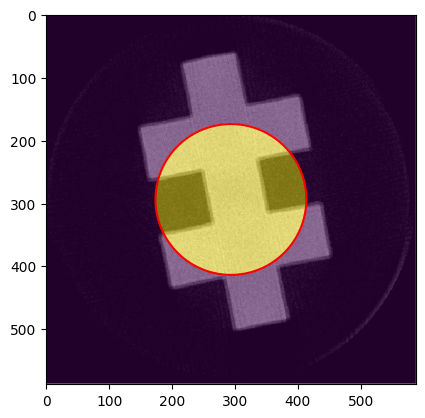

0.42836821376043044


In [46]:
#2
path = './data/'
I = PIL.Image.open(path + 'plusplus.png')
im = np.array(I, dtype=float)/255
im = im[:, :, 0]

N = 300
radius = 120
center = (np.array(im.shape)-1).reshape(2, 1)/2
angles = np.arange(N)*2*np.pi/N
snake = center + radius * np.vstack((np.cos(angles), np.sin(angles)))
mask = skimage.draw.polygon2mask(im.shape, snake.T)

fig, ax = plt.subplots()
ax.imshow(im, cmap=plt.cm.gray)
ax.imshow(mask, alpha=0.5)
ax.plot(snake[0], snake[1], 'r')
plt.show()

m_in = (mask*im).sum()/mask.sum()
m_out =((1-mask) * im).sum()/(1-mask).sum()

v = 0.8
f_ext = (m_in-m_out)*(2*v-m_in-m_out)
print(f_ext)

For the same image and the same curve, what is the value of Eext according to
the first equation in the Section 6.1 of the course note?


In [48]:
E = (((im - m_in)**2) * mask).sum() + (((im - m_out)**2) * (1 - mask)).sum()
print(E)


23265.202043454898


# Layered surfaces

To segment terrain-like surfaces, they construct a graph on a set of sample points from a volume, such that the roughness
of possible solutions is constrained. The optimality of the solution
is defined in terms of a volumetric cost function derived from the
data. The algorithm can find multiple interrelated layered terrainlike and tubular surfaces, which made it applicable for medical image
segmentation and led to numerous extensions. One important extension
involves a cost function which determines an optimal placement of the
surface: a cost function, originally defined only in terms of on-surface
appearance, has been extended to incorporate appearance of the regions
between surfaces 

We also very briefly cover the principle of transforming the data into
a volumetric cost, which is the input to the layered surface detection
algorithm. Also this aspect of the layered surface detection is simplified
for the exercise, where we only consider cost functions derived directly
from pixel intensities


## Layered surface detection
In a discrete volume $x \in\{1, \ldots, X\}, y \in\{1, \ldots, Y\}, z \in\{1, \ldots, Z\}$, a terrain-like surface $s$ defined by $z=s(x, y)$ satisfies a smoothness constraint $\left(\Delta_x, \Delta_y\right)$ if
$$
|s(x, y)-s(x-1, y)| \leq \Delta_x \quad \text { and } \quad|s(x, y)-s(x, y-1)| \leq \Delta_y .
$$
For a cost volume $c(x, y, z)$, an on-surface cost of $s$ is defined as
$$
C_{\mathrm{on}}(s, c)=\sum_{x=1}^X \sum_{y=1}^Y c(x, y, s(x, y))
$$

The optimal net surface problem is concerned with finding a terrainlike surface with a minimum cost among all surfaces satisfying the
smoothness constraint.
The polynomial time solution presented in the work by Wu and Chen
transforms the optimal net surface problem into a problem of finding a
minimum-cost closed set in a node-weighted directed graph with nodes
representing volume voxels. This is further transformed into a problem
of finding a minimum-cost s-t cut in a related arc-weighted directed
graph. Minimum-cost s-t cut can be solved in polynomial time and
efficiently found using the algorithm of Boykov and Kolmogorov, a
well known tool for many image segmentation tasks. While the optimal
net surface problem is ultimately solved using the minimum-cost s-t
cut algorithm, it should be noted that the graph constructed for surface
detection is different from the graph used for Markov random fields.
The solution to the optimal net problem gives a practical tool for
detecting a surface in a volume, or a curve in an image. To use the tool,
we need to (somehow) transform the image data into a cost function
with the property of having small values in regions where we expect to
find the surface. The practical value of the solution to the optical net
problem is further increased by two very useful extensions which we
describe next

## Multiple surfaces

The extension to multiple surfaces developed in 5 may be exemplified by considering two terrain-like surfaces $s_1$ and $s_2$. The surfaces are said to meet an overlap constraint $\left(\delta_{\text {low, }}, \delta_{\text {high }}\right)$ if
$$
\delta_{\text {low }} \leq s_2(x, y)-s_1(x, y) \leq \delta_{\text {high }}
$$
Given two cost volumes $c_1$ and $c_2$ the total cost associated with surfaces $s_1$ and $s_2$ is
$$
C_{a n}\left(s_1, c_1\right)+C_{\text {on }}\left(s_2, c_2\right)
$$
58 ANDEKS MOEHDLM DAHL VEDRANA ANDEKSEN DAHL.
and the optimal surface detection will return a pair of surfaces with a minimum cost among all surfaces satisfying overlap and smoothness constraint. Depending on the problem at hand $c_1$ and $c_2$ may be different or identical, and likewise smoothness constrains may vary or be the same for the two surfaces.
2 Intregion cost
When detecting only cone surface $s$, instead of on-surface cost as in 7.2 we may define a cost for the two regions: the one below the surface and the one above the surface. The cost of the surface s is then given by
$$
\begin{aligned}
& C_{\text {in }}\left(s, c_{\text {belowr }}, c_{\text {abowe }}\right)= \\
& =\sum_{x=1}^X \sum_{y=1}^Y\left(\sum_{z=1}^{s(x, y)} c_{b v o w r}(x, y, z)+\sum_{z=s(x, y)+1}^Z c_{\text {above }}(x, y, z)\right) \text {. } \\
&
\end{aligned}
$$
That is oue surface may be found by defining two cost volumes: one with small values (dark) below and on the surface, and the other with small values above the surface. In-region cost is evaluated over larger area, making this approach very robust to noise. It is also practical in cases where the boundary between two regions is blurry.

Finally, two set of lnyeral (i.e. non-intersecting and ordered) surfaces give rise to an in-region cost corresponding to the regions between two neighboring surfaces. So for two surfaces $s_1$ and $s_2$ we have
$$
C_{\text {in }}\left(s_1, s_2, c_{1,2}\right)=\sum_{x=1}^X \sum_{y=1}^Y \sum_{z=s_1(x, y)+1}^{n[x, y)} c_{1,2}(x, y, z) .
$$
This cost, together with the cost for the region under the surface si and the region over the surface $s_2$, can be incorporated into the minimization problem $^6$. In the text below, we use notation $c_{0,1}$ and $c_{k k+1}$ for the cost volumes below the first and above the last $(k$-th ) surface.



## In-region cost
When detecting only one surface $s$, instead of on-surface cost as in 7.2 we may define a cost for the two regions: the one below the surface and the one above the surface. The cost of the surface $s$ is then given by
$$
\begin{aligned}
& C_{\text {in }}\left(s, c_{\text {below }}, c_{\text {above }}\right)= \\
= & \sum_{x=1}^X \sum_{y=1}^Y\left(\sum_{z=1}^{s(x, y)} c_{\text {below }}(x, y, z)+\sum_{z=s(x, y)+1}^Z c_{\text {above }}(x, y, z)\right) .
\end{aligned}
$$
That is one surface may be found by defining two cost volumes: one with small values (dark) below and on the surface, and the other with small values above the surface. In-region cost is evaluated over larger area, making this approach very robust to noise. It is also practical in cases where the boundary between two regions is blurry.

Finally, two set of layered (i.e. non-intersecting and ordered) surfaces give rise to an in-region cost corresponding to the regions between two neighboring surfaces. So for two surfaces $s_1$ and $s_2$ we have
$$
C_{\text {in }}\left(s_1, s_2, c_{1,2}\right)=\sum_{x=1}^X \sum_{y=1}^Y \sum_{z=s_1(x, y)+1}^{s_2(x, y)} c_{1,2}(x, y, z) .
$$
This cost, together with the cost for the region under the surface $s_1$ and the region over the surface $s_2$, can be incorporated into the minimization problem ${ }^6$. In the text below, we use notation $c_{0,1}$ and $c_{k, k+1}$ for the cost volumes below the first and above the last ( $k$-th) surface.
Summary
To summarize, for finding $K$ cost-optimal layered surfaces we need to define
- $K$ on-surface cost volumes $c_k, k=1, \ldots, K$, and/or
- $K+1$ in-region cost volumes $c_{k, k+1}, k=0, \ldots, K$.
The set of feasible surfaces is given by
- $K$ smoothness constraints $\left(\Delta_x^k, \Delta_y^k\right), k=1, \ldots, K$ and
- $K-1$ overlap constraints $\left(\delta_{\text {low }}^{k, k+1}, \delta_{\text {hight }}^{k, k+1}\right), k=1, \ldots, K-1$.

Layered surface detection has found an immediate use for detecting tubular surfaces. The main principle is the fact that a circle $x^2+y^2=\rho^2$ appears as a straight line r = ρ when represented in polar (r, θ)
coordinates. Detecting a tubular surface is achieved by representing
the volumetric data in a cylindrical coordinate system (r, θ, z) with the
longitudinal axis r = 0 roughly aligned with the center of the tube. We
call this transformation unwrapping the volume, and we also say that
the volume is sampled along the radial rays. An important practical
parameters for unwrapping are the radial and the angular resolution.
In the unwrapped representation, the tubular surface is terrain-like and
can be defined as r = s(θ, z). When using layered surface detection
for detection of tubular surfaces, additional constraints are added to
ensure a smooth transition over θ = 0.


##  Exercise: Layered surfaces in 2D

In [22]:
#ON SURFACE 

I = skimage.io.imread('../../../../Data/week7/layers_A.png').astype(np.int32)

fig, ax = plt.subplots(1,4)
ax[0].imshow(I, cmap='gray')
ax[0].set_title('input image')

#%% one line
delta = 3

layer = slgbuilder.GraphObject(I)
helper = slgbuilder.MaxflowBuilder()
helper.add_object(layer)
helper.add_layered_boundary_cost()
helper.add_layered_smoothness(delta=delta, wrap=False)

helper.solve()
segmentation = helper.what_segments(layer)
segmentation_line = segmentation.shape[0] - np.argmax(segmentation[::-1,:], axis=0) - 1

ax[1].imshow(I, cmap='gray')
ax[1].plot(segmentation_line, 'r')
ax[1].set_title(f'delta = {delta}')


#%% a smoother line
delta = 1

layer = slgbuilder.GraphObject(I)
helper = slgbuilder.MaxflowBuilder()
helper.add_object(layer)
helper.add_layered_boundary_cost()
helper.add_layered_smoothness(delta=delta, wrap=False)

helper.solve()
segmentation = helper.what_segments(layer)
segmentation_line = segmentation.shape[0] - np.argmax(segmentation[::-1,:], axis=0) - 1

ax[2].imshow(I, cmap='gray')
ax[2].plot(segmentation_line, 'r')
ax[2].set_title(f'delta = {delta}')


#%% two lines
layers = [slgbuilder.GraphObject(I), slgbuilder.GraphObject(I)]
delta = 3

helper = slgbuilder.MaxflowBuilder()
helper.add_objects(layers)
helper.add_layered_boundary_cost()
helper.add_layered_smoothness(delta=delta, wrap=False)  
helper.add_layered_containment(layers[0], layers[1], min_margin=15)

helper.solve()
segmentations = [helper.what_segments(l).astype(np.int32) for l in layers]
segmentation_lines = [s.shape[0] - np.argmax(s[::-1,:], axis=0) - 1 for s in segmentations]

ax[3].imshow(I, cmap='gray')
for line in segmentation_lines:
    ax[3].plot(line, 'r')
ax[3].set_title('two dark lines')


Area: 37988.26431523456
